In [109]:
%load_ext autoreload
%autoreload 2

import pandas as pd
from glob import glob
from os import path
from collections import defaultdict, namedtuple
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.patches import Ellipse
from matplotlib.animation import FuncAnimation
plt.style.use('notebook')

import mplcursors

import time

import sys
sys.path.insert(0, path.abspath(path.join(path.curdir, '../src')))

from mythicwind.csv_io import read_frame, read_frames_parallel
from mythicwind.ellipse import *
from mythicwind.report import *
from mythicwind.gps import *

%matplotlib notebook

def correctHeading(x, headingCorrection):

    """

    corrects a given column of directional data with the given headingCorrection

    """

    if x + headingCorrection > 360:
        return (x + headingCorrection) - 360
    else:
        return x + headingCorrection## transform wind an wave direction into the nacelle CS

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Traceback (most recent call last):
  File "/home/san/.local/lib/python3.8/site-packages/matplotlib/cbook/__init__.py", line 196, in process
    func(*args, **kwargs)
  File "/home/san/.local/lib/python3.8/site-packages/matplotlib/animation.py", line 1467, in _stop
    self.event_source.remove_callback(self._loop_delay)
AttributeError: 'NoneType' object has no attribute 'remove_callback'


In [36]:
def onpick(event):
    thisline = event.artist
    xdata = thisline.get_xdata()
    ydata = thisline.get_ydata()
    ind = event.ind
    print('onpick points:', *zip(xdata[ind], ydata[ind]))


def report_sbi_timeseries(data, start, end, landing, smoothing_window='10min', resample_period='2s', ylim_deflection=(0, 0.5), savefig_path=None):

    landing_start = landing - pd.to_timedelta(5, unit='m')
    # landing_end = landing + pd.to_timedelta(5, unit='m')
    landing_end = landing + pd.to_timedelta('30s')
    
    fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(nrows=5, sharex=True, figsize=(22,11))

    # ax1.plot(data.helihoist[start:end].max_deflection.rolling(smoothing_window).mean(), color='tab:red')
    ax1.plot(data.helihoist[start:end].max_deflection, color='tab:red')
    if landing: ax1.axvline(x=landing, color='tab:red')
    ax1.set_ylabel('max. deflection (m)')
    ax1.set_ylim(ylim_deflection)

    # ax2.plot(data.helihoist[start:end].p2p_angle_signed.rolling(smoothing_window).mean(), color='tab:orange')
    ax2.plot(data.helihoist[start:end].p2p_azimuth, color='tab:orange')
    if landing: ax2.axvline(x=landing, color='tab:red')
    ax2.set_ylabel('p2p azimuth (deg)')
        
    # ax3.plot(data.helihoist[start:end].p2p_angle_signed.rolling(smoothing_window).mean().diff()[1:], color='gold')
    ax3.plot(data.helihoist[start:end].ddt_p2p_azimuth, color='gold')
    if landing: ax3.axvline(x=landing, color='tab:red')
    ax3.set_ylabel('d/dt (p2p azimuth) (deg/s)')
    ax3.set_ylim([-180, 180])

    # ax4.plot(data.helihoist[start:end].axis_ratio.rolling(smoothing_window).mean(), color='tab:green')
    ax4.plot(data.helihoist[start:end].axis_ratio, color='tab:green')
    if landing: ax4.axvline(x=landing, color='tab:red')
    ax4.set_ylabel('axis ratio (-)')
    
    ax5.plot(data.helihoist[start:end].ddt_axis_ratio, color='tab:purple')
    if landing: ax5.axvline(x=landing, color='tab:red')
    ax5.set_ylabel('d/dt (axis ratio) (1/s)')
    ax5.set_ylim([-1, 1])
    fig.tight_layout()
    
    fig.canvas.mpl_connect('pick_event', onpick)
    
    if savefig_path: fig.savefig(savefig_path, dpi=300)

def report_sbi_scatter(data, start, end, landing, delta_t_landing='5min', smoothing_window='10min', resample_period='2s', ylim_deflection=(0, 0.5), savefig_path=None):
    
    landing_start = landing - pd.to_timedelta(delta_t_landing)
    landing_end = landing + pd.to_timedelta('30s')
    
    fig, ((ax1, ax2, ax3), (ax4, ax5, ax6), (ax7, ax8, ax9)) = plt.subplots(ncols=3, nrows=3, figsize=(22,22))
    
    ax1.scatter(data.helihoist[start:end].p2p_azimuth, data.helihoist[start:end].max_deflection, facecolor='tab:red', edgecolor='none', alpha=0.2, s=10)
    ax1.scatter(data.helihoist[landing_start:landing_end].p2p_azimuth, data.helihoist[landing_start:landing_end].max_deflection, facecolor='tab:red', edgecolor='white')
    ax1.set_xlabel('p2p azimuth (deg)')
    ax1.set_ylabel('max. deflection (m)')
    ax1.set_ylim(ylim_deflection)
    ax1.grid()
    
    ax2.scatter(data.helihoist[start:end].axis_ratio, data.helihoist[start:end].max_deflection, facecolor='tab:red', edgecolor='none', alpha=0.2, s=10)
    ax2.scatter(data.helihoist[landing_start:landing_end].axis_ratio, data.helihoist[landing_start:landing_end].max_deflection, facecolor='tab:red', edgecolor='white')
    ax2.set_xlabel('axis ratio (-)')
    ax2.set_ylabel('max. deflection (m)')
    ax2.set_ylim(ylim_deflection)
    ax2.grid()
    
    ax3.scatter(data.helihoist[start:end].ddt_p2p_azimuth, data.helihoist[start:end].max_deflection, facecolor='tab:red', edgecolor='none', alpha=0.2, s=10)
    ax3.scatter(data.helihoist[landing_start:landing_end].ddt_p2p_azimuth, data.helihoist[landing_start:landing_end].max_deflection, facecolor='tab:red', edgecolor='white')
    ax3.set_xlabel('d/dt (p2p azimuth) (deg/s)')
    ax3.set_ylabel('max. deflection (m)')
    ax3.set_ylim(ylim_deflection)
    ax3.set_xlim([-180, 180])
    ax3.grid()
    
    ax4.scatter(data.helihoist[start:end].eccentricity, data.helihoist[start:end].ddt_p2p_angle_signed, facecolor='tab:red', edgecolor='none', alpha=0.2, s=10)
    ax4.scatter(data.helihoist[landing_start:landing_end].eccentricity, data.helihoist[landing_start:landing_end].ddt_p2p_angle_signed, facecolor='tab:red', edgecolor='white')
    ax4.set_xlim([1, 0])
    ax4.set_xlabel('eccentricity')
    ax4.set_ylabel('d/dt (p2p azimuth) (deg/s)')
    ax4.set_ylim([-180, 180])
    ax4.grid()
    
    ax5.scatter(data.helihoist[start:end].axis_ratio, data.helihoist[start:end].ddt_p2p_azimuth, facecolor='tab:red', edgecolor='none', alpha=0.2, s=10)
    ax5.scatter(data.helihoist[landing_start:landing_end].axis_ratio, data.helihoist[landing_start:landing_end].ddt_p2p_azimuth, facecolor='tab:red', edgecolor='white')
    ax5.set_xlabel('axis ratio (-)')
    ax5.set_ylabel('d/dt (p2p azimuth) (deg/s)')
    ax5.set_ylim([-180, 180])
    ax5.grid()
    
    ax6.scatter(data.helihoist[start:end].ddt_axis_ratio, data.helihoist[start:end].max_deflection, facecolor='tab:red', edgecolor='none', alpha=0.2, s=10)
    ax6.scatter(data.helihoist[landing_start:landing_end].ddt_axis_ratio, data.helihoist[landing_start:landing_end].max_deflection, facecolor='tab:red', edgecolor='white')
    ax6.set_xlabel('d/dt (axis ratio) (1/s)')
    ax6.set_ylabel('max. deflection (m)')
    ax6.set_ylim(ylim_deflection)
    ax6.set_xlim([-1, 1])
    ax6.grid()
    
    ax7.scatter(data.helihoist[start:end].p2p_azimuth, data.helihoist[start:end].ddt_p2p_azimuth, facecolor='tab:red', edgecolor='none', alpha=0.2, s=10)
    ax7.scatter(data.helihoist[landing_start:landing_end].p2p_azimuth, data.helihoist[landing_start:landing_end].ddt_p2p_azimuth, facecolor='tab:red', edgecolor='white', alpha=0.2, s=10)
    ax7.set_xlabel('p2p azimuth (deg)')
    ax7.set_ylabel('d/dt (p2p azimuth) (deg/s)')
    ax7.set_ylim([-180, 180])
    #ax7.set_xlim([-1, 1])
    ax7.grid()
    
    fig.tight_layout()
    
    # fig.canvas.mpl_connect('pick_event', onpick)
    
    if savefig_path: fig.savefig(savefig_path, dpi=300)
    
def report_sbi_distributions(data, start, end, landing, smoothing_window='10min', resample_period='2s', savefig_path=None):
    
    # deflection_p2pRatio = data.helihoist[start:end].max_deflection.rolling(smoothing_window).mean()/data.helihoist[start:end].axis_ratio.rolling(smoothing_window).mean()
    # grad_p2p = data.helihoist[start:end].p2p_angle_signed.resample(resample_period).mean().diff()[1:].fillna(method='ffill')
    
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(ncols=2, nrows=2, figsize=(22,11))
    
    ax1.hist(data.helihoist[start:end].max_deflection, bins=50,)
    ax1.set_xlabel('max. deflection (m)')
    
    ax2.hist(data.helihoist[start:end].p2p_angle_signed, bins=50,)
    ax2.set_xlabel('p2p azimuth (deg)')
    
    ax3.hist(data.helihoist[start:end].axis_ratio, bins=50,)
    ax3.set_xlabel('axis ratio (-)')
    
    ax4.hist(data.helihoist[start:end].ddt_p2p_angle_signed, bins=50,)
    ax4.set_xlabel('d/dt(p2p azimuth) (deg/sec)')
    fig.tight_layout()
    
    fig.canvas.mpl_connect('pick_event', onpick)
    
    if savefig_path: fig.savefig(savefig_path, dpi=300)
   
    #ax1.hist(data.helihoist[start:end].max_deflection, bins='fd',)

In [228]:
def report_timeseries(data, start, end, landing, smoothing_window='10min', resample_period='2s', ylim_deflection=(0, 0.5), savefig_path=None):

    landing_start = landing - pd.to_timedelta(5, unit='m')
    # landing_end = landing + pd.to_timedelta(5, unit='m')
    landing_end = landing + pd.to_timedelta('30s')
    
    fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(nrows=5, sharex=True, figsize=(22,11))

    # ax1.plot(data[start:end].max_deflection.rolling(smoothing_window).mean(), color='tab:red')
    ax1.plot(data[start:end].max_deflection, color='tab:red')
    if landing: ax1.axvline(x=landing, color='tab:red')
    ax1.set_ylabel('max. deflection (m)')
    ax1.set_ylim(ylim_deflection)

    # ax2.plot(data[start:end].p2p_angle_signed.rolling(smoothing_window).mean(), color='tab:orange')
    ax2.plot(data[start:end].p2p_azimuth, color='tab:orange')
    if landing: ax2.axvline(x=landing, color='tab:red')
    ax2.set_ylabel('p2p azimuth (deg)')
        
    # ax3.plot(data[start:end].p2p_angle_signed.rolling(smoothing_window).mean().diff()[1:], color='gold')
    ax3.plot(data[start:end].ddt_p2p_azimuth, color='gold')
    if landing: ax3.axvline(x=landing, color='tab:red')
    ax3.set_ylabel('d/dt (p2p azimuth) (deg/s)')
    ax3.set_ylim([-180, 180])

    # ax4.plot(data[start:end].axis_ratio.rolling(smoothing_window).mean(), color='tab:green')
    ax4.plot(data[start:end].axis_ratio, color='tab:green')
    if landing: ax4.axvline(x=landing, color='tab:red')
    ax4.set_ylabel('axis ratio (-)')
    
    ax5.plot(data[start:end].ddt_axis_ratio, color='tab:purple')
    if landing: ax5.axvline(x=landing, color='tab:red')
    ax5.set_ylabel('d/dt (axis ratio) (1/s)')
    ax5.set_ylim([-1, 1])
    fig.tight_layout()
    
    fig.canvas.mpl_connect('pick_event', onpick)
    
    if savefig_path: fig.savefig(savefig_path, dpi=300)

def report_scatter(data, start, end, landing, delta_t_landing='5min', smoothing_window='10min', resample_period='2s', ylim_deflection=(0, 0.5), savefig_path=None):
    
    landing_start = landing - pd.to_timedelta(delta_t_landing)
    landing_end = landing + pd.to_timedelta('30s')
    
    fig, ((ax1, ax2, ax3), (ax4, ax5, ax6), (ax7, ax8, ax9)) = plt.subplots(ncols=3, nrows=3, figsize=(22,22))
    
    ax1.scatter(data[start:end].p2p_azimuth, data[start:end].max_deflection, facecolor='tab:red', edgecolor='none', alpha=0.2, s=10)
    ax1.scatter(data[landing_start:landing_end].p2p_azimuth, data[landing_start:landing_end].max_deflection, facecolor='tab:red', edgecolor='white')
    ax1.set_xlabel('p2p azimuth (deg)')
    ax1.set_ylabel('max. deflection (m)')
    ax1.set_ylim(ylim_deflection)
    ax1.grid()
    
    ax2.scatter(data[start:end].axis_ratio, data[start:end].max_deflection, facecolor='tab:red', edgecolor='none', alpha=0.2, s=10)
    ax2.scatter(data[landing_start:landing_end].axis_ratio, data[landing_start:landing_end].max_deflection, facecolor='tab:red', edgecolor='white')
    ax2.set_xlabel('axis ratio (-)')
    ax2.set_ylabel('max. deflection (m)')
    ax2.set_ylim(ylim_deflection)
    ax2.grid()
    
    ax3.scatter(data[start:end].ddt_p2p_azimuth, data[start:end].max_deflection, facecolor='tab:red', edgecolor='none', alpha=0.2, s=10)
    ax3.scatter(data[landing_start:landing_end].ddt_p2p_azimuth, data[landing_start:landing_end].max_deflection, facecolor='tab:red', edgecolor='white')
    ax3.set_xlabel('d/dt (p2p azimuth) (deg/s)')
    ax3.set_ylabel('max. deflection (m)')
    ax3.set_ylim(ylim_deflection)
    ax3.set_xlim([-180, 180])
    ax3.grid()
    
    ax4.scatter(data[start:end].eccentricity, data[start:end].ddt_p2p_angle_signed, facecolor='tab:red', edgecolor='none', alpha=0.2, s=10)
    ax4.scatter(data[landing_start:landing_end].eccentricity, data[landing_start:landing_end].ddt_p2p_angle_signed, facecolor='tab:red', edgecolor='white')
    ax4.set_xlim([1, 0])
    ax4.set_xlabel('eccentricity')
    ax4.set_ylabel('d/dt (p2p azimuth) (deg/s)')
    ax4.set_ylim([-180, 180])
    ax4.grid()
    
    ax5.scatter(data[start:end].axis_ratio, data[start:end].ddt_p2p_azimuth, facecolor='tab:red', edgecolor='none', alpha=0.2, s=10)
    ax5.scatter(data[landing_start:landing_end].axis_ratio, data[landing_start:landing_end].ddt_p2p_azimuth, facecolor='tab:red', edgecolor='white')
    ax5.set_xlabel('axis ratio (-)')
    ax5.set_ylabel('d/dt (p2p azimuth) (deg/s)')
    ax5.set_ylim([-180, 180])
    ax5.grid()
    
    ax6.scatter(data[start:end].ddt_axis_ratio, data[start:end].max_deflection, facecolor='tab:red', edgecolor='none', alpha=0.2, s=10)
    ax6.scatter(data[landing_start:landing_end].ddt_axis_ratio, data[landing_start:landing_end].max_deflection, facecolor='tab:red', edgecolor='white')
    ax6.set_xlabel('d/dt (axis ratio) (1/s)')
    ax6.set_ylabel('max. deflection (m)')
    ax6.set_ylim(ylim_deflection)
    ax6.set_xlim([-1, 1])
    ax6.grid()
    
    ax7.scatter(data[start:end].p2p_azimuth, data[start:end].ddt_p2p_azimuth, facecolor='tab:red', edgecolor='none', alpha=0.2, s=10)
    ax7.scatter(data[landing_start:landing_end].p2p_azimuth, data[landing_start:landing_end].ddt_p2p_azimuth, facecolor='tab:red', edgecolor='white', alpha=0.2, s=10)
    ax7.set_xlabel('p2p azimuth (deg)')
    ax7.set_ylabel('d/dt (p2p azimuth) (deg/s)')
    ax7.set_ylim([-180, 180])
    #ax7.set_xlim([-1, 1])
    ax7.grid()
    
    fig.tight_layout()
    
    # fig.canvas.mpl_connect('pick_event', onpick)
    
    if savefig_path: fig.savefig(savefig_path, dpi=300)
    
def report_distributions(data, start, end, landing, smoothing_window='10min', resample_period='2s', savefig_path=None):
    
    # deflection_p2pRatio = data[start:end].max_deflection.rolling(smoothing_window).mean()/data[start:end].axis_ratio.rolling(smoothing_window).mean()
    # grad_p2p = data[start:end].p2p_angle_signed.resample(resample_period).mean().diff()[1:].fillna(method='ffill')
    
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(ncols=2, nrows=2, figsize=(22,11))
    
    ax1.hist(data[start:end].max_deflection, bins=50,)
    ax1.set_xlabel('max. deflection (m)')
    
    ax2.hist(data[start:end].p2p_angle_signed, bins=50,)
    ax2.set_xlabel('p2p azimuth (deg)')
    
    ax3.hist(data[start:end].axis_ratio, bins=50,)
    ax3.set_xlabel('axis ratio (-)')
    
    ax4.hist(data[start:end].ddt_p2p_angle_signed, bins=50,)
    ax4.set_xlabel('d/dt(p2p azimuth) (deg/sec)')
    fig.tight_layout()
    
    fig.canvas.mpl_connect('pick_event', onpick)
    
    if savefig_path: fig.savefig(savefig_path, dpi=300)
   
    #ax1.hist(data[start:end].max_deflection, bins='fd',)

In [4]:
"""
turbine-08,2019-10-15 09:05,2019-10-15 10:05,00:59:55,1571123113,1571126708
turbine-08,2019-10-15 16:28,2019-10-15 17:47,01:18:50,1571149693,1571154423
turbine-08,2019-10-16 03:07,2019-10-16 04:35,01:28:24,1571188044,1571193348
"""

data_dir = '../data/turbines/turbine-08/'

sbi_delta_t = pd.to_timedelta(1, unit='h')

nacelle_installation_end = pd.to_datetime('1571050800', unit='s', utc=True)

blade1_landing = pd.to_datetime('1571123113', unit='s', utc=True)
blade2_landing = pd.to_datetime('1571149693', unit='s', utc=True)
blade3_landing = pd.to_datetime('1571188044', unit='s', utc=True)

blade_landings = (blade1_landing, blade2_landing, blade3_landing)

blade1_start = blade1_landing - sbi_delta_t
blade1_end = blade1_landing + sbi_delta_t

blade2_start = blade2_landing - sbi_delta_t
blade2_end = blade2_landing + sbi_delta_t

blade3_start = blade3_landing - sbi_delta_t
blade3_end = blade3_landing + sbi_delta_t

In [5]:
data = dict()
data_raw = dict()
gnss_data = dict()
lidar = list()
waves = list()

for pos in ('helihoist-1', 'sbittip', 'sbitroot'):
    pos_dir = path.join(data_dir, pos)
    if path.isdir(pos_dir):
        print(f'processing {pos_dir}')
        
#        raw_data = path.join(pos_dir, 'tom/clean')
#        if path.isdir(raw_data):
#            data_raw[pos] = pd.concat(read_frames_parallel(raw_data))
        
        pos_data = path.join(pos_dir, 'tom/acc-vel-pos')
        if path.isdir(pos_data):
            data[pos] = pd.concat(read_frames_parallel(pos_data))

        gnss_file = path.join(pos_dir, f'tom/gps/turbine-08_{pos}_tom_gps.csv')
        if path.isfile(gnss_file):
            # print(f'found gnss file: {gnss_file}')
            gnss_data[pos] = read_frame(gnss_file)

for i in (13, 14, 15, 16):
    lidar.append(read_frame(glob(f'../data/environment/wind/lidar/lidar_2019-10-{i}.csv')[0]))
    waves.append(read_frame(glob(f'../data/environment/waves/wmb-sued/wmb-sued_2019-10-{i}.csv')[0]))

lidar = pd.concat(lidar)
waves = pd.concat(waves)

lidar.insert(loc = len(lidar.columns), column = 'tu_3', value = lidar.wind_speed_3.rolling('10min').apply(lambda x : np.std(x) / np.mean(x)))

processing ../data/turbines/turbine-08/helihoist-1
processing ../data/turbines/turbine-08/sbittip
processing ../data/turbines/turbine-08/sbitroot


In [118]:
#Dataset_raw = namedtuple('Dataset_raw', ['helihoist', 'sbitroot', 'sbittip'])
Dataset = namedtuple('Dataset', ['helihoist', 'sbitroot', 'sbittip', 'lidar', 'waves'])
GeometryDataset = namedtuple('GeomtryDataset', ['helihoist', 'sbitroot', 'sbittip', 'lidar', 'waves'])
GNSS = namedtuple('GNSS', ['helihoist', 'sbitroot', 'sbittip'])

#turbine_8_raw = Dataset_raw(data_raw['helihoist-1'], data_raw['sbitroot'], data_raw['sbittip'])
turbine_8 = Dataset(data['helihoist-1'], data['sbitroot'], data['sbittip'], lidar, waves)
turbine_8_gnss = GNSS(gnss_data['helihoist-1'], gnss_data['sbitroot'], gnss_data['sbittip'])
turbine_8_geometry = GeometryDataset(geometry_analysis(data['helihoist-1']), geometry_analysis(data['sbitroot']), geometry_analysis(data['sbittip']), lidar, waves)

omitting last element


## Detect installation stages with gnss

<IPython.core.display.Javascript object>


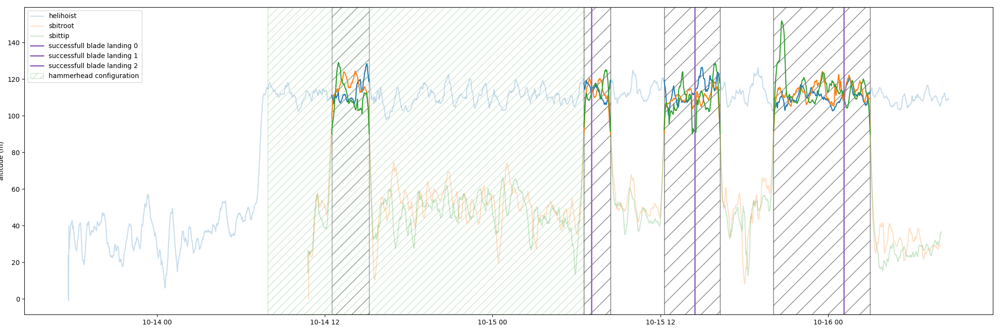

0
1
2
0
first successful blade landing
1
2
0
1
2
0
1
2


In [11]:
sbi_limit = 90

hh, sr, st = (turbine_8_gnss.helihoist.altitude.resample('1s').mean().rolling('20min').mean(), turbine_8_gnss.sbitroot.altitude.resample('1s').mean().rolling('20min').mean(), turbine_8_gnss.sbittip.altitude.resample('1s').mean().rolling('20min').mean())

hammerhead_start = hh[hh > sbi_limit].index[0] + pd.to_timedelta('30min')

hh_sbi = hh[(hh > sbi_limit) & (sr > sbi_limit) & (st > sbi_limit)]
sr_sbi = sr[(hh > sbi_limit) & (sr > sbi_limit) & (st > sbi_limit)]
st_sbi = st[(hh > sbi_limit) & (sr > sbi_limit) & (st > sbi_limit)]


ii = hh_sbi[hh_sbi.index.to_series().diff() > pd.to_timedelta(60, unit='s')].index.to_list()
ii.insert(0, hh_sbi.index[0])
ii.insert(len(ii), hh_sbi.index[-1])

sbi_indices = list()

for i in range(len(ii) - 1):
    sbi_indices.append((ii[i], hh_sbi[ii[i]:ii[i+1]].index[-2]))

plt.figure()    

plt.plot(hh, alpha=0.25, label='helihoist')
plt.plot(sr, alpha=0.25, label='sbitroot')
plt.plot(st, alpha=0.25, label='sbittip')

for (start, end) in sbi_indices:
    plt.plot(hh[start:end], color='tab:blue')
    plt.plot(sr[start:end], color='tab:orange')
    plt.plot(st[start:end], color='tab:green')
    
    for blade_landing_i, blade_landing in enumerate(blade_landings):
        print(blade_landing_i)
        plt.axvspan(xmin=start, xmax=end, hatch='/', facecolor='white', alpha=0.25, edgecolor='k')
        if blade_landing > start and blade_landing < end:
            plt.axvline(x=blade_landing, color='tab:purple', linewidth=2, label=f'successfull blade landing {blade_landing_i}')
            if blade_landing_i == 0:
                print(f'first successful blade landing')
                hammerhead_end = blade_landing - pd.to_timedelta('30min')
                plt.axvspan(xmin=hammerhead_start, xmax=hammerhead_end, label='hammerhead configuration', facecolor='white', alpha=0.25, edgecolor='tab:green', hatch='//')
plt.tight_layout()
plt.ylabel('altitude (m)')
plt.legend(loc='upper left')
# mplcursors.cursor(hover=True)

plt.savefig('../results/turbine-08/GNSS.png', dpi=300)

## Estimate nacelle orientation during installation

single blade installation start 2019-10-14 12:50:00+00:00 to 2019-10-16 02:40:00+00:00
sbit vector: (0.00034023640217004623, -0.0002229097710061967)
nacelle orientation due north: 33


<IPython.core.display.Javascript object>


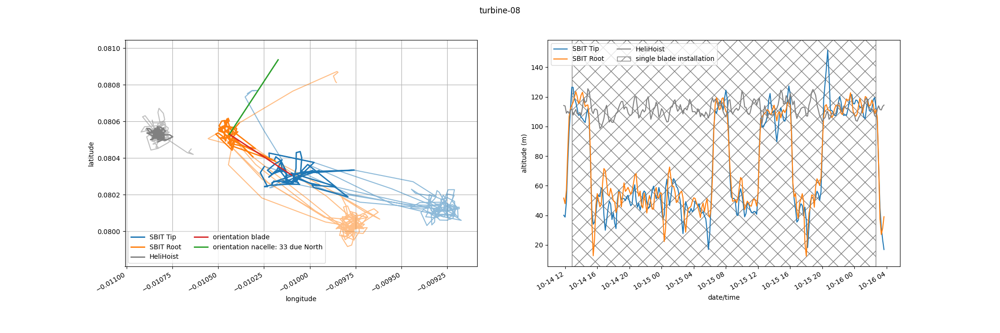

In [12]:
hh, sr, st, ii = estimate_sbi(helihoist=turbine_8_gnss.helihoist,
                              sbitroot=turbine_8_gnss.sbitroot,
                              sbittip=turbine_8_gnss.sbittip,
                             )
if not len(ii) > 0:
    print(f'failed to identify installation times for {name}... skipping')

sbi_start = ii[0]
sbi_stop = ii[-1]
print(f'single blade installation start {sbi_start} to {sbi_stop}')

sbitroot_v, sbit_v, nacelle_v, nacelle_angle = estimate_nacelle_orientation(sbitroot_gps=sr,
                                                                            sbittip_gps=st,
                                                                            sbi_time_index=ii,
                                                                           )

plot_sbi(sbitroot_gps=sr,
         sbittip_gps=st,
         helihoist_gps=hh,
         sbitroot_v=sbitroot_v,
         sbit_v=sbit_v,
         nacelle_v=nacelle_v,
         sbi_time_indices=ii,
         turbine_name='turbine-08',
         output_dir='../results/turbine-08/',
         nacelle_angle=nacelle_angle,
        )

In [13]:
for i in range(0, 11):
    key = f'wind_dir_{i}_corr'
    ### list comprehension faster? -> yes
    turbine_8.lidar.insert(loc = len(turbine_8.lidar.columns), 
                           column = f'wind_dir_{i}_nacelle',
                           value = [correctHeading(x, -1*nacelle_angle) for x in turbine_8.lidar[key]]
                          )

In [14]:
turbine_8.waves.insert(loc=len(turbine_8.waves.columns), 
                       column='Dirp_nacelle',
                       value=[correctHeading(x, -1*nacelle_angle) for x in turbine_8.waves.Dirp]
                      )

## Wind data

<IPython.core.display.Javascript object>


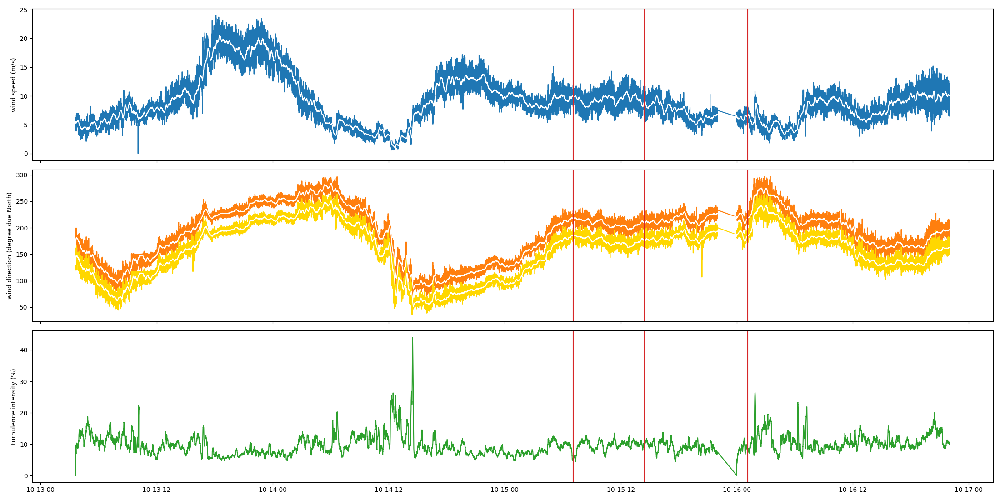

In [15]:
fig, (ax1, ax2, ax3) = plt.subplots(nrows=3, figsize=(22,11), sharex=True)
ax1.plot(turbine_8.lidar.wind_speed_3, color='tab:blue')
ax1.plot(turbine_8.lidar.wind_speed_3.rolling('10min').mean(), color='white')
ax1.set_ylabel('wind speed (m/s)')
ax1.axvline(x=blade1_landing, color='tab:red', label='blade landing')
ax1.axvline(x=blade2_landing, color='tab:red')
ax1.axvline(x=blade3_landing, color='tab:red')

ax2.plot(turbine_8.lidar.wind_dir_3_corr, color='tab:orange')
ax2.plot(turbine_8.lidar.wind_dir_3_nacelle, color='gold')
ax2.plot(turbine_8.lidar.wind_dir_3_corr.rolling('10min').mean(), color='white')
ax2.plot(turbine_8.lidar.wind_dir_3_nacelle.rolling('10min').mean(), color='white')
ax2.set_ylabel('wind direction (degree due North)')
ax2.axvline(x=blade1_landing, color='tab:red', label='blade landing')
ax2.axvline(x=blade2_landing, color='tab:red')
ax2.axvline(x=blade3_landing, color='tab:red')

ax3.plot(turbine_8.lidar.tu_3*100, color='tab:green')
ax3.set_ylabel('turbulence intensity (%)')
ax3.axvline(x=blade1_landing, color='tab:red', label='blade landing')
ax3.axvline(x=blade2_landing, color='tab:red')
ax3.axvline(x=blade3_landing, color='tab:red')

fig.tight_layout()
plt.savefig('../results/turbine-08/wind.png', dpi=300)

## Wave data

<IPython.core.display.Javascript object>


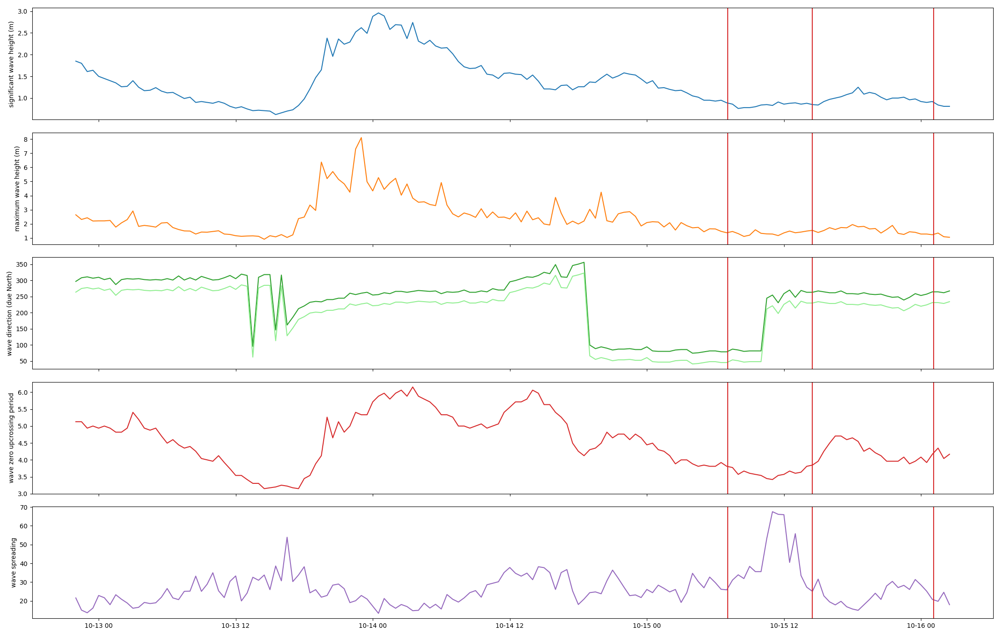

In [16]:
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(nrows=5, figsize=(22,14), sharex=True)

ax1.plot(turbine_8.waves.Hm0, color='tab:blue')
ax1.set_ylabel('significant wave height (m)')
ax1.axvline(x=blade1_landing, color='tab:red', label='blade landing')
ax1.axvline(x=blade2_landing, color='tab:red')
ax1.axvline(x=blade3_landing, color='tab:red')

ax2.plot(turbine_8.waves.Hmax, color='tab:orange')
ax2.set_ylabel('maximum wave height (m)')
ax2.axvline(x=blade1_landing, color='tab:red', label='blade landing')
ax2.axvline(x=blade2_landing, color='tab:red')
ax2.axvline(x=blade3_landing, color='tab:red')

ax3.plot(turbine_8.waves.Dirp, color='tab:green')
ax3.plot(turbine_8.waves.Dirp_nacelle, color='lightgreen')
ax3.set_ylabel('wave direction (due North)')
ax3.axvline(x=blade1_landing, color='tab:red', label='blade landing')
ax3.axvline(x=blade2_landing, color='tab:red')
ax3.axvline(x=blade3_landing, color='tab:red')

ax4.plot(turbine_8.waves.Tz, color='tab:red')
ax4.set_ylabel('wave zero upcrossing period')
ax4.axvline(x=blade1_landing, color='tab:red', label='blade landing')
ax4.axvline(x=blade2_landing, color='tab:red')
ax4.axvline(x=blade3_landing, color='tab:red')

ax5.plot(turbine_8.waves.Sprp, color='tab:purple')
ax5.set_ylabel('wave spreading')
ax5.axvline(x=blade1_landing, color='tab:red', label='blade landing')
ax5.axvline(x=blade2_landing, color='tab:red')
ax5.axvline(x=blade3_landing, color='tab:red')

fig.tight_layout()
plt.savefig('../results/turbine-08/waves.png', dpi=300)

## Ellipse Fitting

<IPython.core.display.Javascript object>


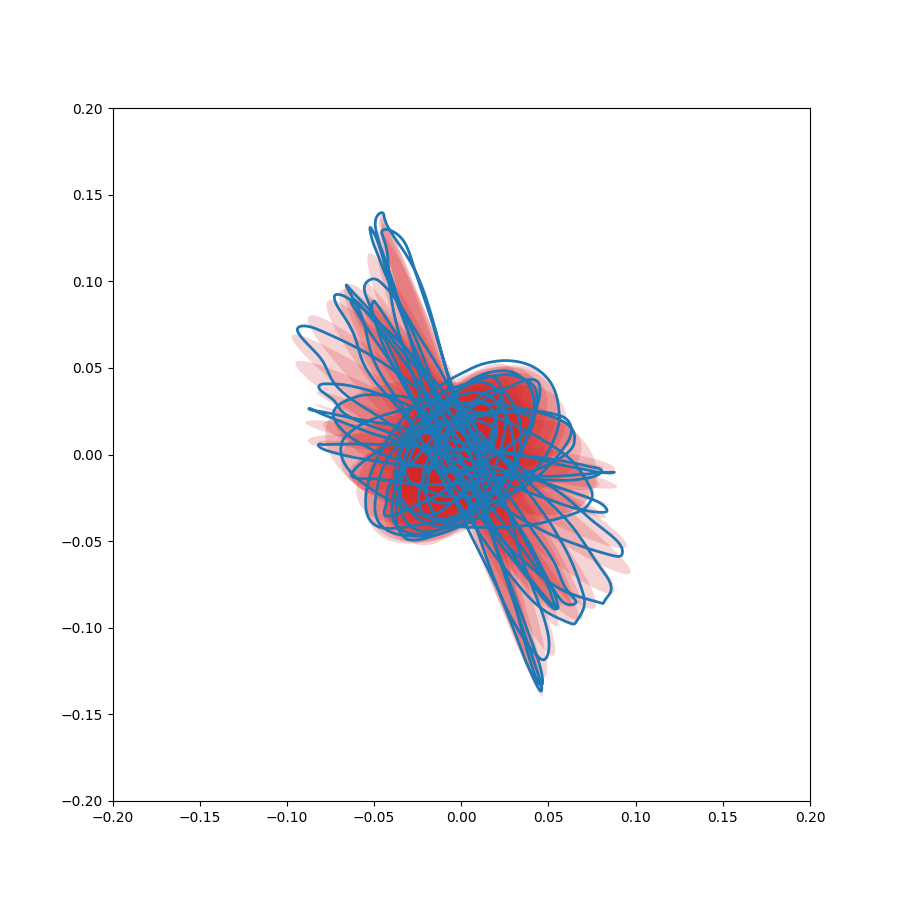

In [28]:
start = pd.to_datetime('2019-10-15 14:01:00+02:00')
end = pd.to_datetime('2019-10-15 14:03:30+02:00')

orbit_i = turbine_8.helihoist[start:end].index
geometry_i = turbine_8_geometry.helihoist[start:end].index.to_list()

nframes = 3600

p2p_x, p2p_y = [], []
orbit_x, orbit_y = [], []

fig = plt.figure(figsize=(9, 9))
plt.axis('equal')
ax = plt.axes(xlim=(-0.2, 0.2), ylim=(-0.2, 0.2))

orbit, = ax.plot([], [], lw=2, color='tab:blue')
p2p, = ax.plot([], [], lw=2, color='white')


def init():
    # remove the first index from the geometry index list
    geometry_i.pop(0)
    p2p.set_data([], [])
    orbit.set_data([], [])
    return (p2p, orbit)

def update(i):
    if geometry_i[0] == orbit_i[i]:
        t = geometry_i.pop(0)
        print(f'found matching indices: {i} -> {t}, {orbit_i[i]}')
        p2p_x.append(turbine_8.helihoist.pos_z[t]) 
        p2p_y.append(turbine_8.helihoist.pos_x[t])
        #p2p.set_data(p2p_x, p2p_y)
        
        ax.add_artist(Ellipse((0,0),
                              2 * turbine_8_geometry.helihoist.axis_ratio.loc[t] * turbine_8_geometry.helihoist.max_deflection.loc[t],
                              2 * turbine_8_geometry.helihoist.max_deflection.loc[t],
                              angle = turbine_8_geometry.helihoist.p2p_angle_signed.loc[t],
                              alpha = 0.2,
                              facecolor = 'tab:red',
                              edgecolor = 'None',
                             )
                     )
        
        
    orbit_x.append(turbine_8.helihoist.pos_z[orbit_i[i]])
    orbit_y.append(turbine_8.helihoist.pos_x[orbit_i[i]])
    
    orbit.set_data(orbit_x, orbit_y)
    return (p2p, orbit)

anim = FuncAnimation(fig, update, init_func=init, frames=nframes, interval=5, blit=True, repeat=False)
#anim.save(f'turbine-08_orbit.mp4') 

## Turbine behaviour hammerhead

<IPython.core.display.Javascript object>


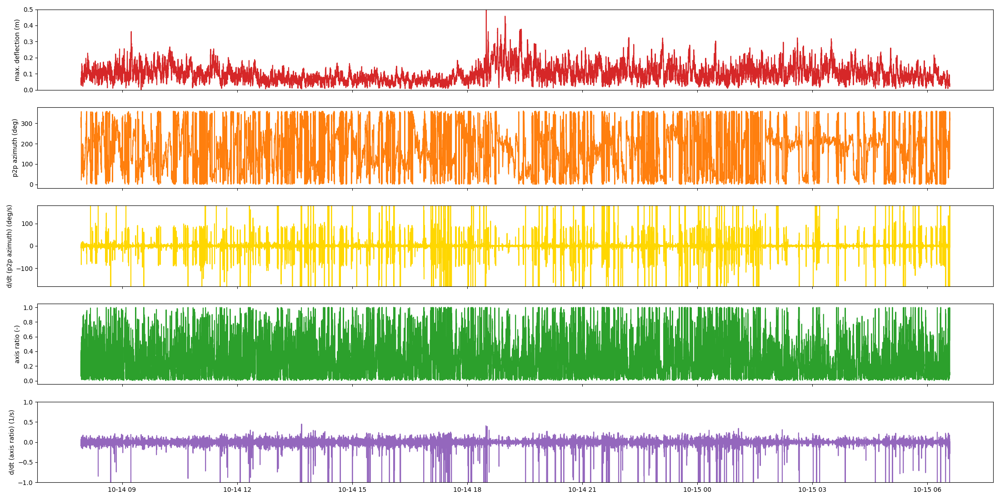

<IPython.core.display.Javascript object>


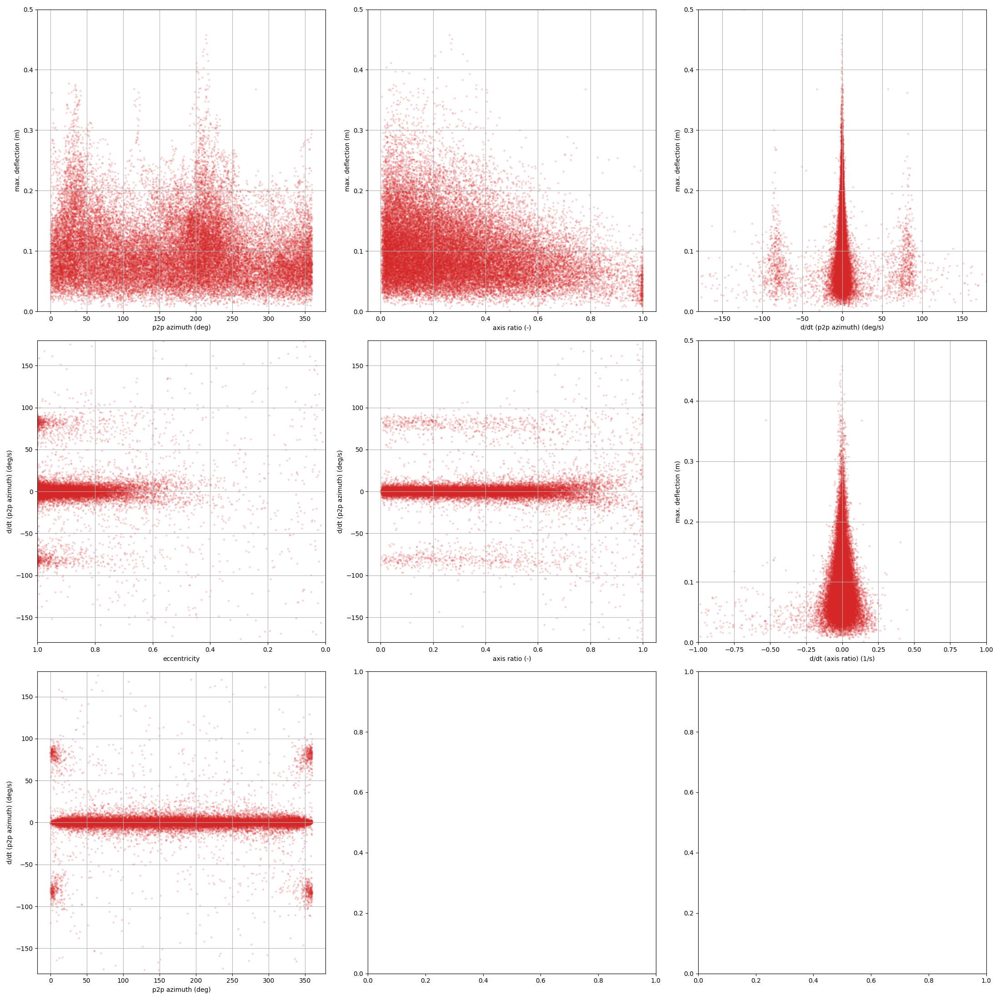

<IPython.core.display.Javascript object>


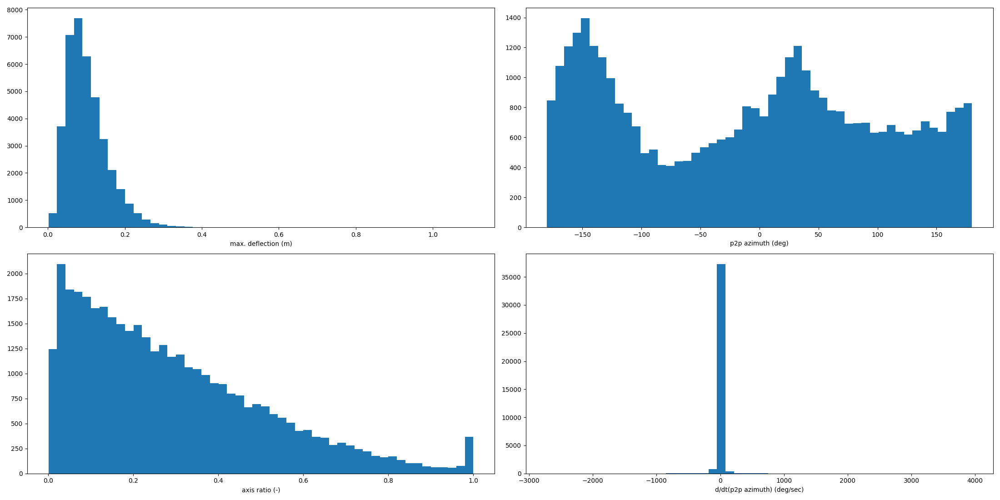

In [37]:
report_sbi_timeseries(turbine_8_geometry, start=hammerhead_start, end=hammerhead_end, landing=None, smoothing_window='1s', savefig_path='../results/turbine-08/hammerhead_timeseries.png')
report_sbi_scatter(turbine_8_geometry, start=hammerhead_start, end=hammerhead_end, landing=None, smoothing_window='1s', savefig_path='../results/turbine-08/hammerhead_scatter.png')
report_sbi_distributions(turbine_8_geometry, start=hammerhead_start, end=hammerhead_end, landing=None, smoothing_window='1s', savefig_path='../results/turbine-08/hammerhead_distribution.png')

<ipython-input-100-ce8e1f041674>:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(nrows=4, sharex=True)


<IPython.core.display.Javascript object>


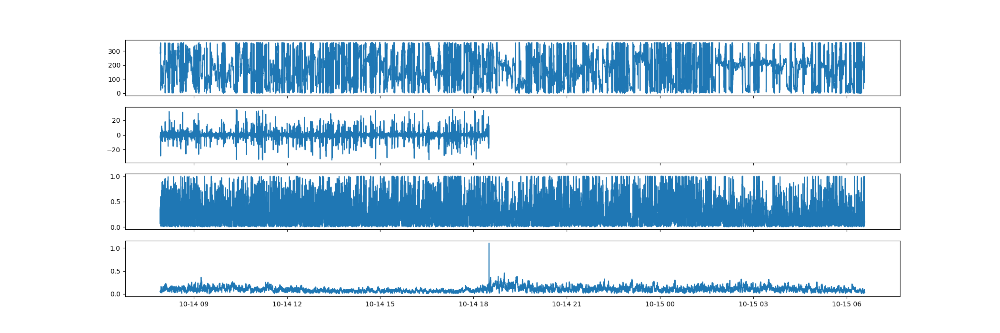

/usr/lib64/python3.8/site-packages/numpy/lib/function_base.py:1519: RuntimeWarning: invalid value encountered in remainder
  ddmod = mod(dd + pi, 2*pi) - pi
/usr/lib64/python3.8/site-packages/numpy/lib/function_base.py:1520: RuntimeWarning: invalid value encountered in greater
  _nx.copyto(ddmod, pi, where=(ddmod == -pi) & (dd > 0))
/usr/lib64/python3.8/site-packages/numpy/lib/function_base.py:1522: RuntimeWarning: invalid value encountered in less
  _nx.copyto(ph_correct, 0, where=abs(dd) < discont)


DatetimeIndex(['2019-10-14 07:55:25+00:00', '2019-10-14 07:55:30+00:00',
               '2019-10-14 07:55:35+00:00', '2019-10-14 07:55:40+00:00',
               '2019-10-14 07:55:45+00:00', '2019-10-14 07:55:50+00:00',
               '2019-10-14 07:55:55+00:00', '2019-10-14 07:56:00+00:00',
               '2019-10-14 07:56:05+00:00', '2019-10-14 07:56:10+00:00',
               ...
               '2019-10-15 06:34:25+00:00', '2019-10-15 06:34:30+00:00',
               '2019-10-15 06:34:35+00:00', '2019-10-15 06:34:40+00:00',
               '2019-10-15 06:34:45+00:00', '2019-10-15 06:34:50+00:00',
               '2019-10-15 06:34:55+00:00', '2019-10-15 06:35:00+00:00',
               '2019-10-15 06:35:05+00:00', '2019-10-15 06:35:10+00:00'],
              dtype='datetime64[ns, UTC]', length=16318, freq='5S')


In [100]:
def calc_ddt_angle(angle_timeseries):
    t = (angle_timeseries.index.to_series().astype('int64')/1e9).to_numpy()
    x = np.deg2rad(angle_timeseries.to_numpy())
    x = np.unwrap(x)
    return (angle_timeseries.index, np.rad2deg(np.gradient(x, t)))

dt = turbine_8_geometry.helihoist[hammerhead_start:hammerhead_end].index.to_series().diff().dt.total_seconds().fillna(value=0.0)
fig, ax = plt.subplots(nrows=4, sharex=True)

ax[0].plot(turbine_8_geometry.helihoist[hammerhead_start:hammerhead_end].p2p_azimuth)
#ax[0].plot(turbine_8_geometry.helihoist[hammerhead_start:hammerhead_end].p2p_azimuth.resample('5s').mean())

#t = turbine_8_geometry.helihoist[hammerhead_start:hammerhead_end].p2p_azimuth.resample('5s').mean().index
t, x = calc_ddt_angle(turbine_8_geometry.helihoist[hammerhead_start:hammerhead_end].p2p_azimuth.resample('5s').mean())

grad_df = pd.DataFrame({'time' : t, 'ddt_p2p_azimuth' : x})
grad_df.set_index('time', inplace=True)

print(t)

ax[1].plot(t, x)

ax[2].plot(turbine_8_geometry.helihoist[hammerhead_start:hammerhead_end].axis_ratio)
ax[3].plot(turbine_8_geometry.helihoist[hammerhead_start:hammerhead_end].max_deflection)

In [224]:
t8_hh = data['helihoist-1'][hammerhead_start:hammerhead_end]
t8_hh_g = geometry_analysis(t8_hh)

omitting last element
epoch
2019-10-14 07:55:28.434000015+00:00    0.024197
2019-10-14 07:55:30.480000019+00:00    0.019454
2019-10-14 07:55:32.493000031+00:00    0.003161
2019-10-14 07:55:34.703999996+00:00    0.011231
2019-10-14 07:55:36.980999947+00:00    0.016682
                                         ...   
2019-10-15 06:35:02.447999954+00:00    0.017259
2019-10-15 06:35:04.890000105+00:00    0.016110
2019-10-15 06:35:06.407999992+00:00    0.020252
2019-10-15 06:35:08.486999989+00:00    0.011983
2019-10-15 06:35:10.664999962+00:00    0.002852
Name: deflection, Length: 38458, dtype: float64
epoch
2019-10-14 07:55:29.457000017+00:00    0.050802
2019-10-14 07:55:31.470000029+00:00    0.052030
2019-10-14 07:55:33.648000002+00:00    0.058705
2019-10-14 07:55:35.825999975+00:00    0.061516
2019-10-14 07:55:38.003999949+00:00    0.053532
                                         ...   
2019-10-15 06:35:00.930000067+00:00    0.031187
2019-10-15 06:35:04.197000027+00:00    0.022314
2019-1

/home/san/Projekte/mythicwind/src/mythicwind/ellipse.py:95: RuntimeWarning: invalid value encountered in sqrt
  eccentricity = np.sqrt(


<IPython.core.display.Javascript object>


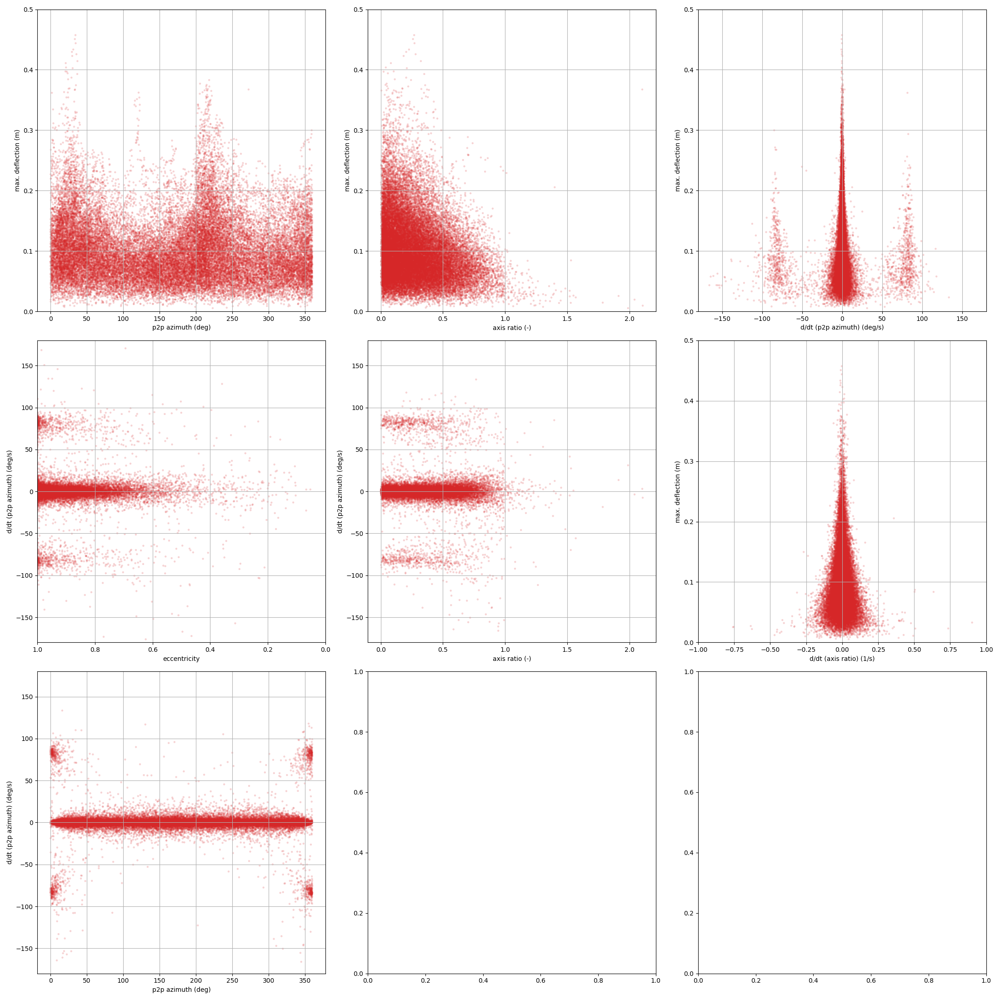

In [231]:
report_scatter(t8_hh_g, start=hammerhead_start, end=hammerhead_end, landing=None)

In [222]:
t = t8_hh.index.to_numpy()

if hasattr(t8_hh, 'deflection'):
    deflection = t8_hh.deflection
else:
    # calculate deflection
    deflection = calc_deflection(
        t8_hh.pos_x, t8_hh.pos_z)

# find max an min deflection
max_deflection_i, max_deflection_t, max_deflection = find_max_deflection(t, deflection, min_distance_peaks=15, peak_width=7)
min_deflection_i, min_deflection_t, min_deflection = find_min_deflection(t, deflection, min_distance_peaks=15, peak_width=7)
# calculate angles
max_deflection_angles_t, max_deflection_signed_angles, max_deflection_unsigned_angle = calc_max_deflection_angles(
    t, max_deflection_i, t8_hh.pos_z.to_numpy(), -1*t8_hh.pos_x.to_numpy(), skip_odd=False)
# calculate p2p angles
p2p_t, p2p_signed_angles, p2p_unsigned_angles = calc_p2p_angles(t8_hh.pos_z.to_numpy(),
                                                                -1*t8_hh.pos_x.to_numpy(),
                                                                max_deflection_i,
                                                                max_deflection_t,
                                                               )

# calculate orbit shape parameters
ratio_df = calc_axis_ratio(min_deflection,
                           max_deflection
                          )

omitting last element
epoch
2019-10-14 07:55:28.434000015+00:00    0.024197
2019-10-14 07:55:30.480000019+00:00    0.019454
2019-10-14 07:55:32.493000031+00:00    0.003161
2019-10-14 07:55:34.703999996+00:00    0.011231
2019-10-14 07:55:36.980999947+00:00    0.016682
                                         ...   
2019-10-15 06:35:02.447999954+00:00    0.017259
2019-10-15 06:35:04.890000105+00:00    0.016110
2019-10-15 06:35:06.407999992+00:00    0.020252
2019-10-15 06:35:08.486999989+00:00    0.011983
2019-10-15 06:35:10.664999962+00:00    0.002852
Name: deflection, Length: 38458, dtype: float64
epoch
2019-10-14 07:55:29.457000017+00:00    0.050802
2019-10-14 07:55:31.470000029+00:00    0.052030
2019-10-14 07:55:33.648000002+00:00    0.058705
2019-10-14 07:55:35.825999975+00:00    0.061516
2019-10-14 07:55:38.003999949+00:00    0.053532
                                         ...   
2019-10-15 06:35:00.930000067+00:00    0.031187
2019-10-15 06:35:04.197000027+00:00    0.022314
2019-1

<ipython-input-210-04cf58f63a28>:29: RuntimeWarning: invalid value encountered in sqrt
  eccentricity = np.sqrt(1 - np.power((min_deflection.to_numpy() / max_deflection.to_numpy()), 2))


In [217]:
dt = max_deflection.index.to_series().diff().dt.total_seconds()
print(dt)

epoch
2019-10-14 07:55:29.457000017+00:00      NaN
2019-10-14 07:55:31.470000029+00:00    2.013
2019-10-14 07:55:33.648000002+00:00    2.178
2019-10-14 07:55:35.825999975+00:00    2.178
2019-10-14 07:55:38.003999949+00:00    2.178
                                       ...  
2019-10-15 06:35:00.930000067+00:00    2.145
2019-10-15 06:35:04.197000027+00:00    3.267
2019-10-15 06:35:07.496999979+00:00    3.300
2019-10-15 06:35:09.608999968+00:00    2.112
2019-10-15 06:35:11.720999956+00:00    2.112
Name: epoch, Length: 38461, dtype: float64


<IPython.core.display.Javascript object>


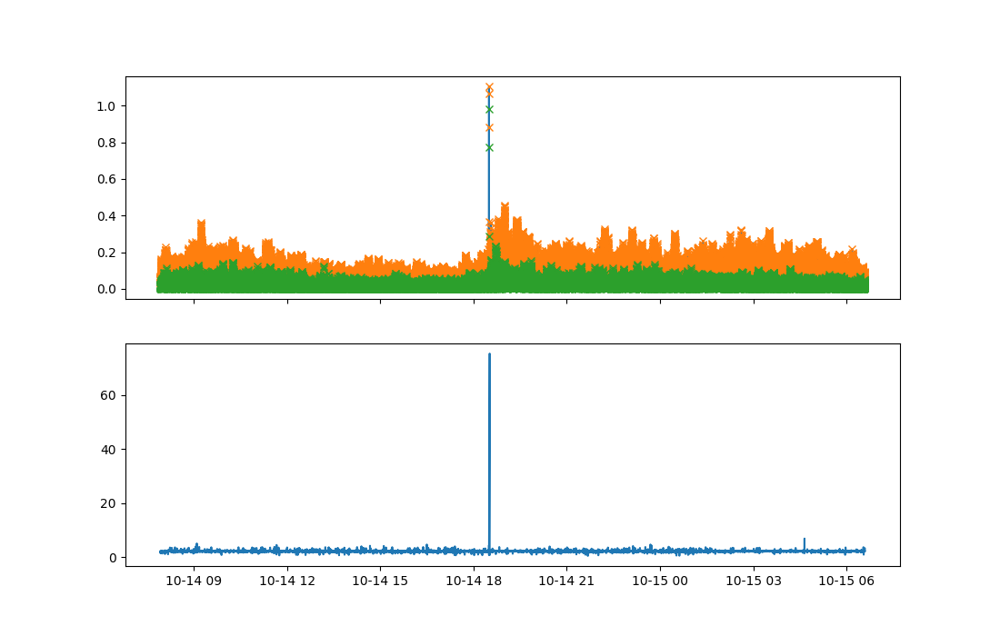

38458
38457


In [223]:
fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(11, 7))
ax[0].plot(t8_hh.deflection,)
ax[0].plot(max_deflection_t, max_deflection, marker='x', ls='none')
ax[0].plot(min_deflection_t, min_deflection, marker='x', ls='none')

ax[1].plot(dt)

print(len(min_deflection))
print(len(max_deflection))

[ 53 121 184 237 301 364 431 494] Float64Index([1571072593.761, 1571072596.005, 1571072598.084, 1571072599.833,
              1571072601.945, 1571072604.024, 1571072606.235, 1571072608.314],
             dtype='float64', name='epoch')
epoch
2019-10-14 17:03:13.760999918+00:00    0.026443
2019-10-14 17:03:16.005000114+00:00    0.025029
2019-10-14 17:03:18.084000111+00:00    0.026654
2019-10-14 17:03:19.832999945+00:00    0.015954
2019-10-14 17:03:21.944999933+00:00    0.001080
2019-10-14 17:03:24.023999929+00:00    0.006165
2019-10-14 17:03:26.234999895+00:00    0.002949
2019-10-14 17:03:28.313999891+00:00    0.009384
Name: deflection, dtype: float64
epoch
2019-10-14 17:03:12.539999962+00:00    0.047676
2019-10-14 17:03:14.816999912+00:00    0.046234
2019-10-14 17:03:17.160000086+00:00    0.035808
2019-10-14 17:03:18.809999943+00:00    0.031226
2019-10-14 17:03:20.756999969+00:00    0.031960
2019-10-14 17:03:23.132999897+00:00    0.036776
2019-10-14 17:03:25.145999908+00:00    0.035862


<IPython.core.display.Javascript object>


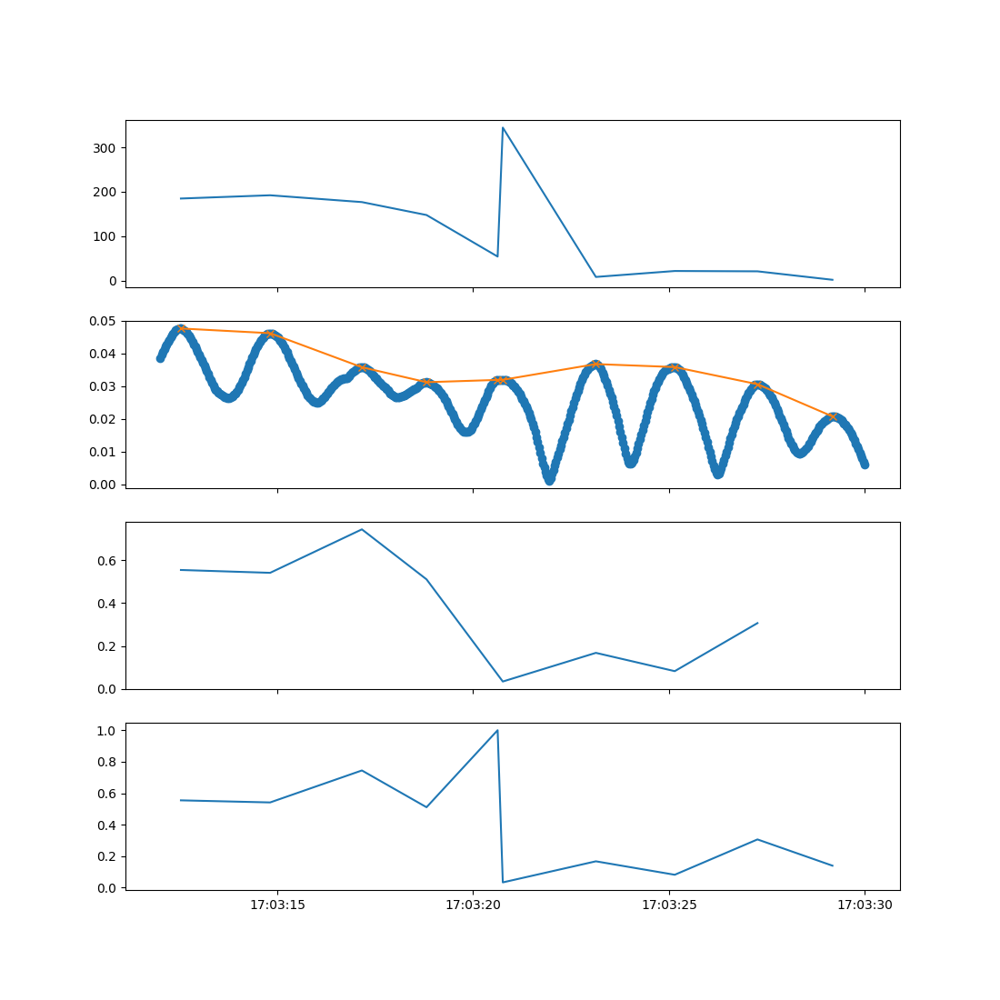

In [210]:
def calc_axis_ratio(min_deflection, max_deflection):
    """
    calculates the ratio between maximum and minimum deflection, corresponding to the half-major
    and half-minor axis, if the orbit was an elipse

    returns: ratio_t: the time stamp coinciding with the ratio
             ratio:   the actual ratio
    """
    print(min_deflection)
    print(max_deflection)
    
    #if min_deflection_t[0] < max_deflection_t[0]:
    if min_deflection.index[0] < max_deflection.index[0]:
        print('min index comes first, removing')
        min_deflection = min_deflection[1:]

    if len(min_deflection) > len(max_deflection):
        print('minimum has more elements')
        min_deflection = min_deflection[:-1]
    elif len(min_deflection) < len(max_deflection):
        print('maximum has more elements')
        max_deflection = max_deflection[:-1]

    if not len(min_deflection) == len(max_deflection):
        print(len(min_deflection), len(max_deflection))
        raise Exception(
            'min_deflection and max_deflection are not of equal length!')

    eccentricity = np.sqrt(1 - np.power((min_deflection.to_numpy() / max_deflection.to_numpy()), 2))

    return pd.DataFrame({'axis_ratio' : min_deflection.to_numpy()/max_deflection.to_numpy(),
                         'eccentricity' : eccentricity,
                        }, index = max_deflection.index)


start = pd.to_datetime('2019-10-14 17:03:12', utc=True)
end   = pd.to_datetime('2019-10-14 17:03:30', utc=True)

t = turbine_8.helihoist[start:end].index.astype('int64')/1e9

min_i, min_t, min_d = find_min_deflection(t, turbine_8.helihoist.deflection[start:end], min_distance_peaks=30)
max_i, max_t, max_d = find_max_deflection(t, turbine_8.helihoist.deflection[start:end], min_distance_peaks=30)

print(min_i, min_t)

a = calc_axis_ratio(min_d, max_d)

print(a)

fig, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=4, sharex=True, figsize=(11,11))
ax1.plot(turbine_8_geometry.helihoist[start:end].p2p_azimuth)
ax2.plot(turbine_8.helihoist[start:end].deflection, marker='o')
ax2.plot(turbine_8_geometry.helihoist[start:end].max_deflection, marker='x')

ax3.plot(a.axis_ratio)

ax4.plot(turbine_8_geometry.helihoist[start:end].axis_ratio)
#ax5.plot(turbine_8.helihoist[start:end].pos_x, turbine_8.helihoist[start:end].pos_z)
#ax5.scatter(turbine_8.helihoist.pos_x.loc[turbine_8_geometry.helihoist.max_deflection[start:end].index], turbine_8.helihoist.pos_z.loc[turbine_8_geometry.helihoist.max_deflection[start:end].index])

ax5.axis('equal')
ax5.grid()

In [148]:
min_d.to_numpy()/max_d.to_numpy()[:-1]

array([0.55463965, 0.54135485, 0.7443588 , 0.51092039, 0.03379224,
       0.1676365 , 0.08223189, 0.30653644])

<IPython.core.display.Javascript object>


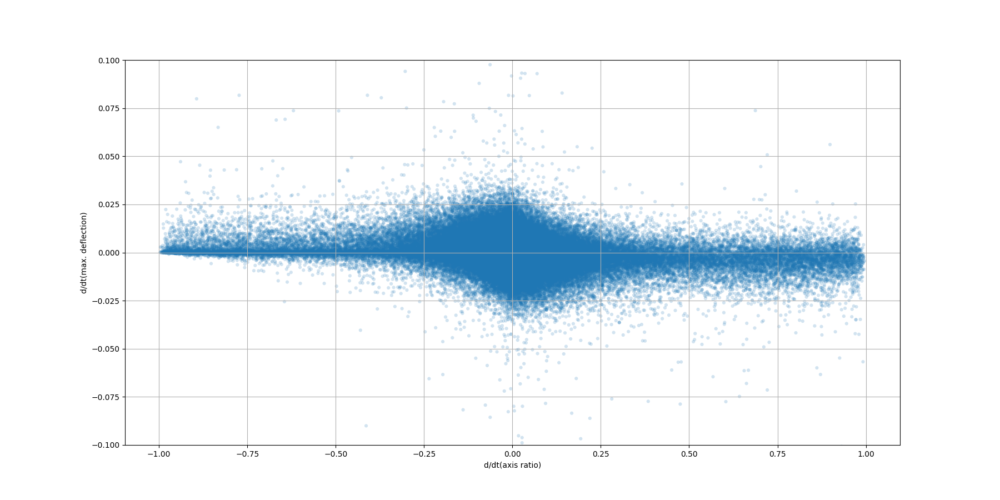

In [84]:
plt.figure(figsize=(18, 9))
plt.scatter(turbine_8_geometry.helihoist.ddt_axis_ratio, turbine_8_geometry.helihoist.ddt_max_deflection, alpha=0.2, edgecolor='none', s=20)
plt.ylabel('d/dt(max. deflection)')
plt.xlabel('d/dt(axis ratio)')
plt.ylim((-0.1, 0.1))
plt.grid()

<IPython.core.display.Javascript object>


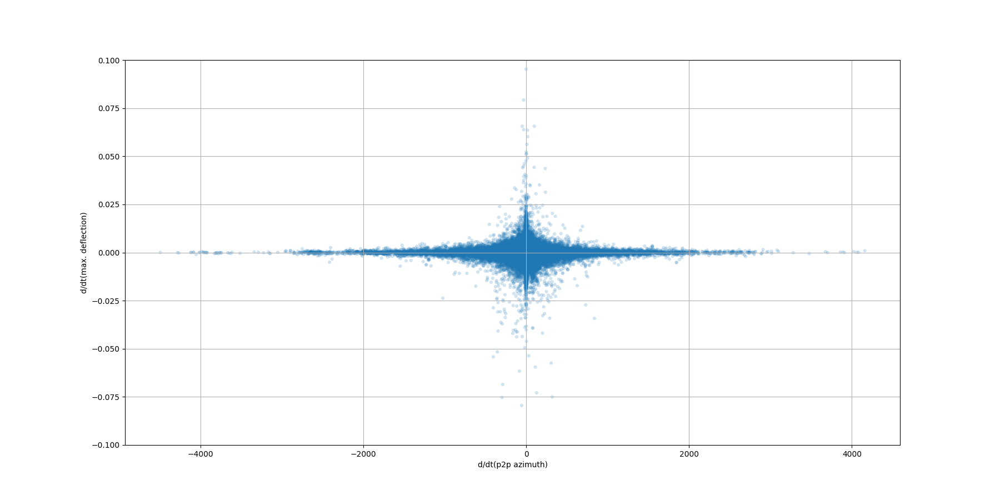

In [33]:
plt.figure(figsize=(18, 9))
plt.scatter(turbine_8_geometry.helihoist.ddt_p2p_azimuth, turbine_8_geometry.helihoist.ddt_max_deflection, alpha=0.2, edgecolor='none', s=20)
plt.ylabel('d/dt(max. deflection)')
plt.xlabel('d/dt(p2p azimuth)')
plt.ylim((-0.1, 0.1))
plt.grid()

## Turbine behaviout during single blade installation

<IPython.core.display.Javascript object>


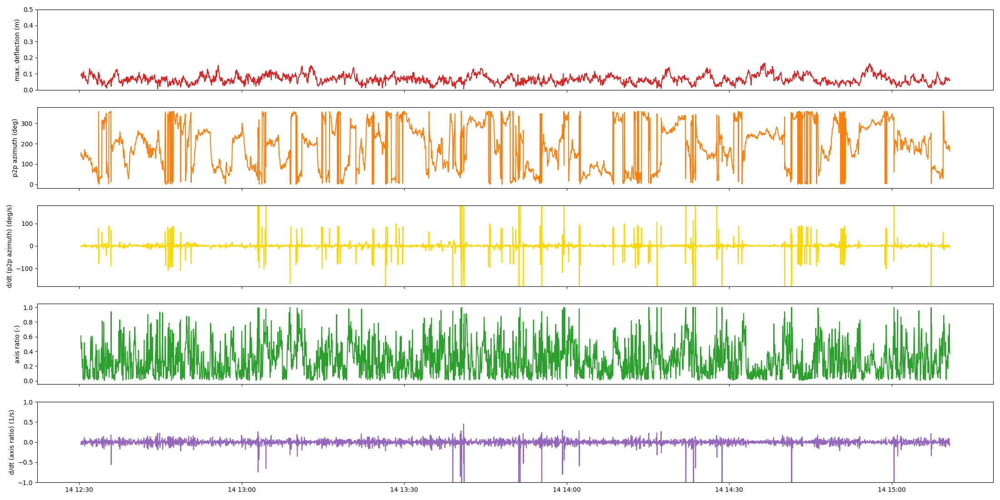

<IPython.core.display.Javascript object>


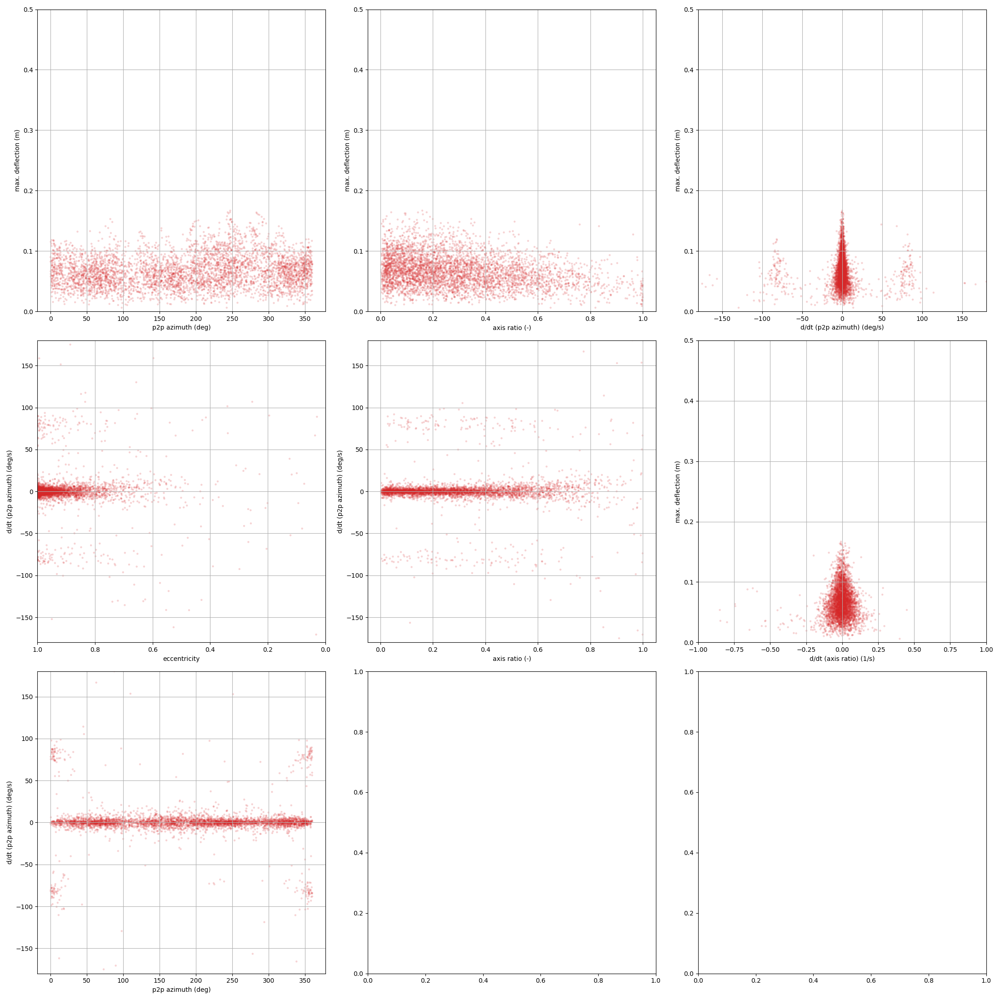

<IPython.core.display.Javascript object>


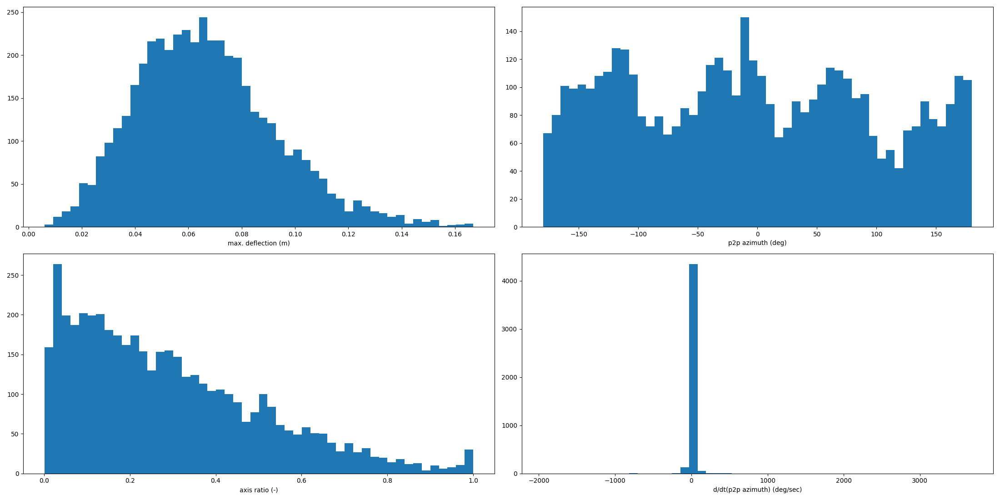

found a matching blade landing: 2019-10-15 07:05:13+00:00


<IPython.core.display.Javascript object>


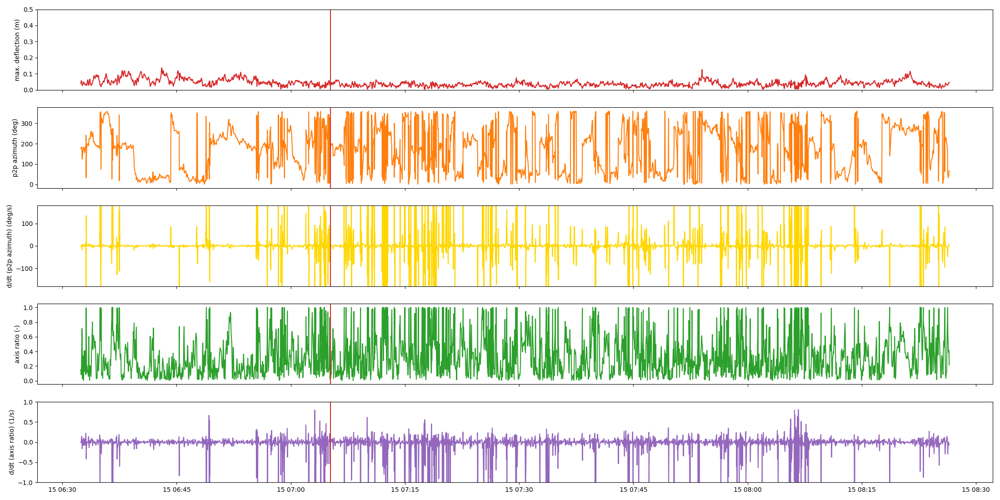

<IPython.core.display.Javascript object>


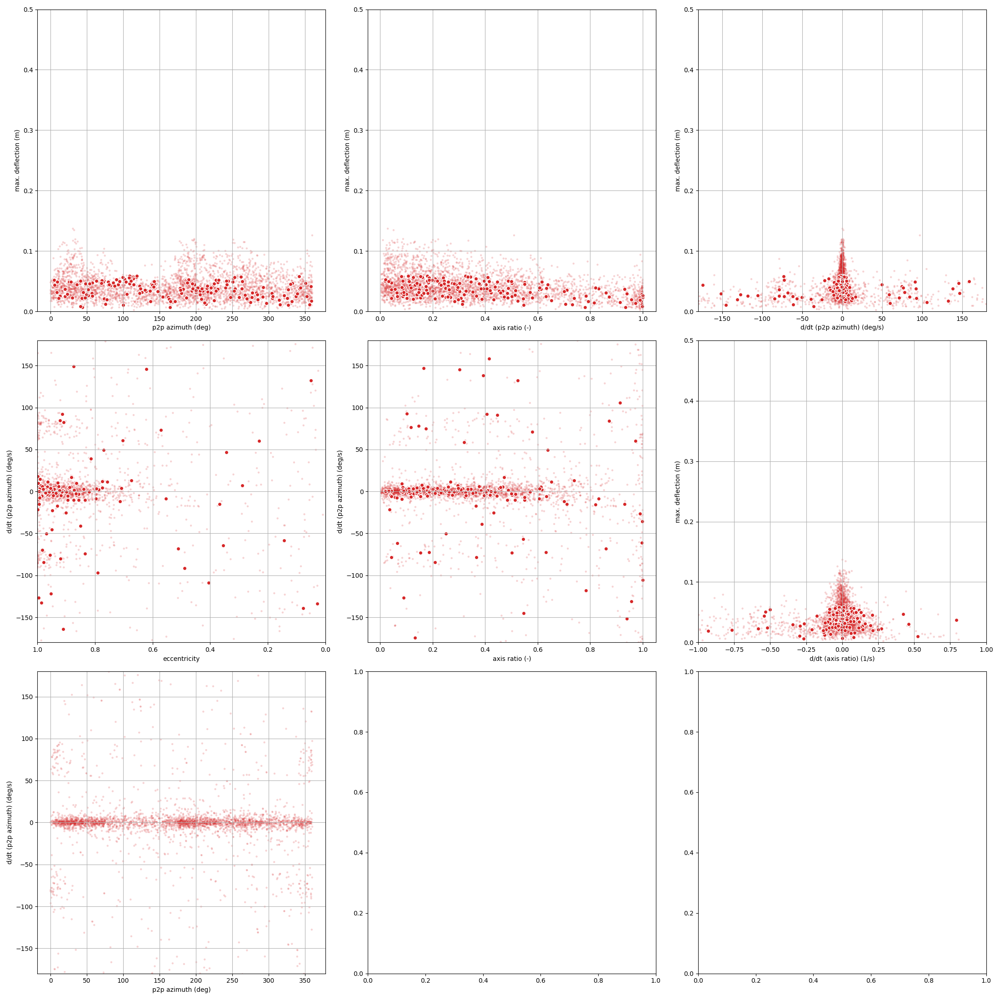

<IPython.core.display.Javascript object>


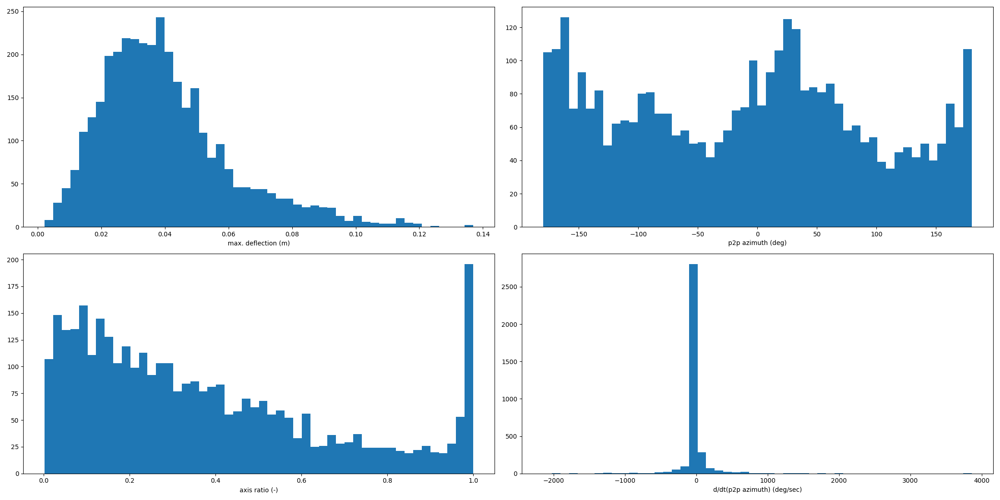

found a matching blade landing: 2019-10-15 14:28:13+00:00


<IPython.core.display.Javascript object>


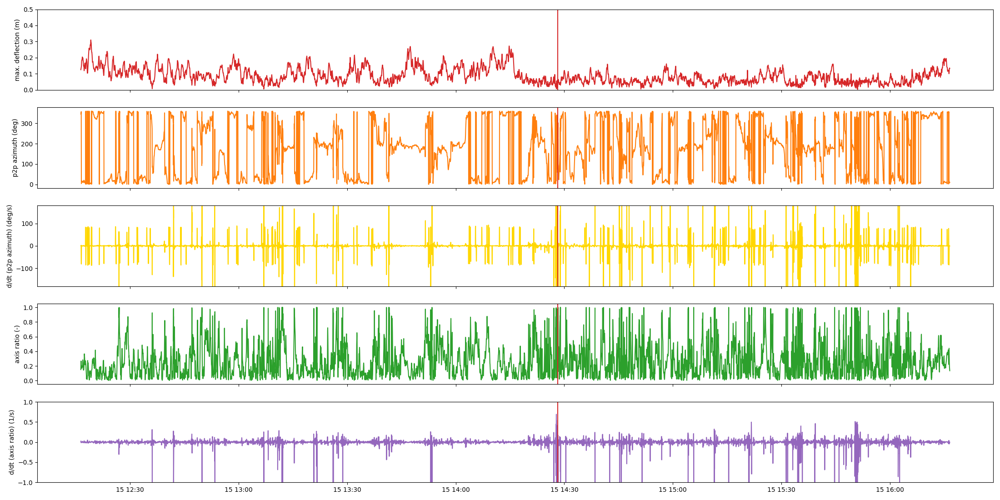

<IPython.core.display.Javascript object>


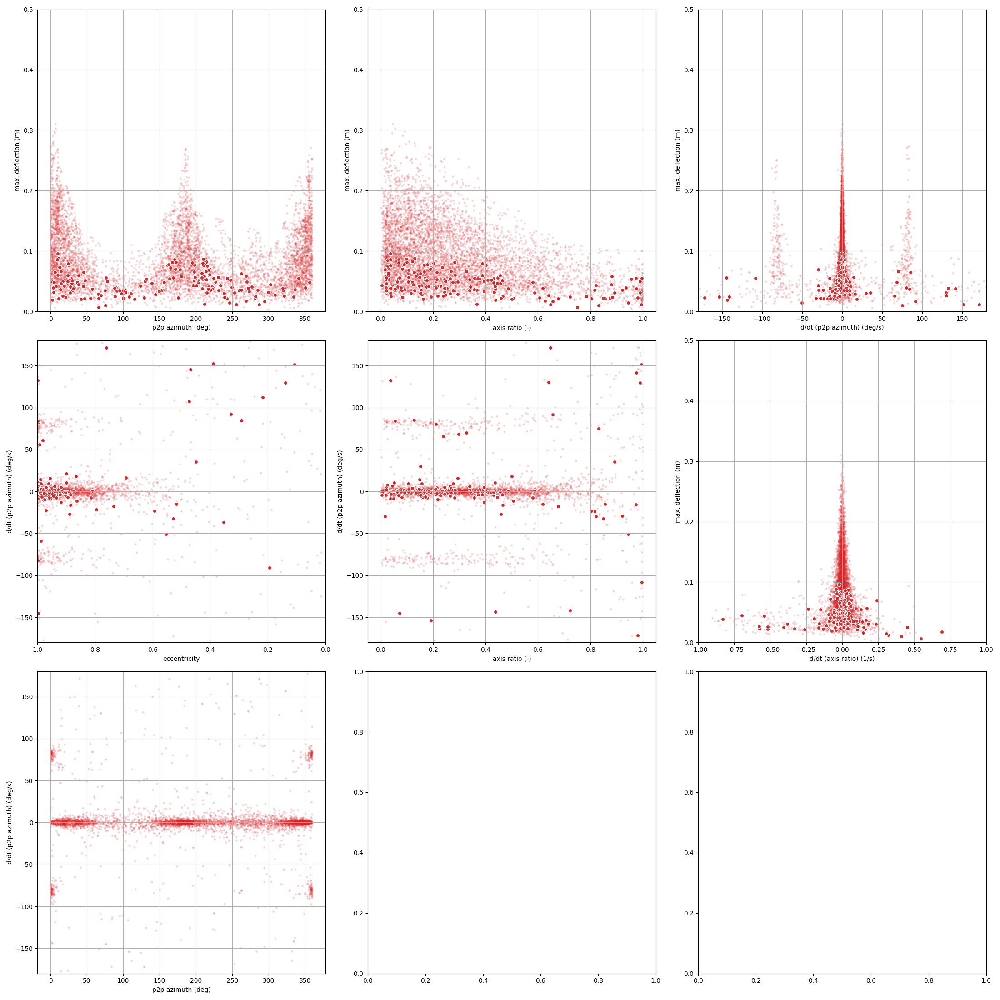

<IPython.core.display.Javascript object>


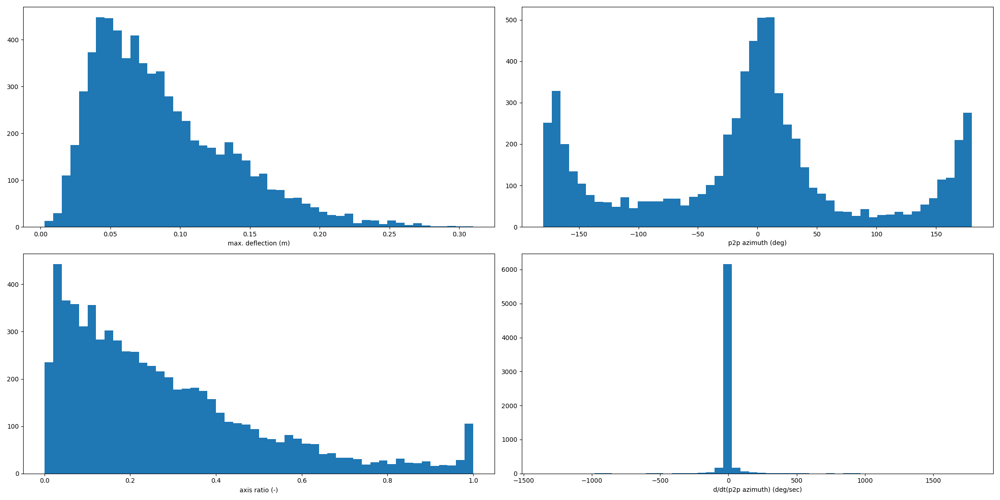

found a matching blade landing: 2019-10-16 01:07:24+00:00


<IPython.core.display.Javascript object>


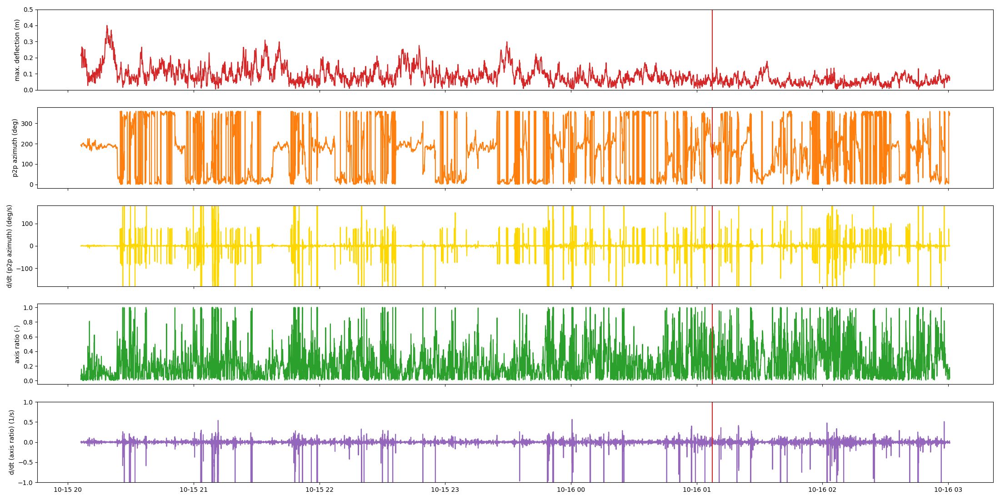

<ipython-input-36-228d043cd431>:54: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ((ax1, ax2, ax3), (ax4, ax5, ax6), (ax7, ax8, ax9)) = plt.subplots(ncols=3, nrows=3, figsize=(22,22))


<IPython.core.display.Javascript object>


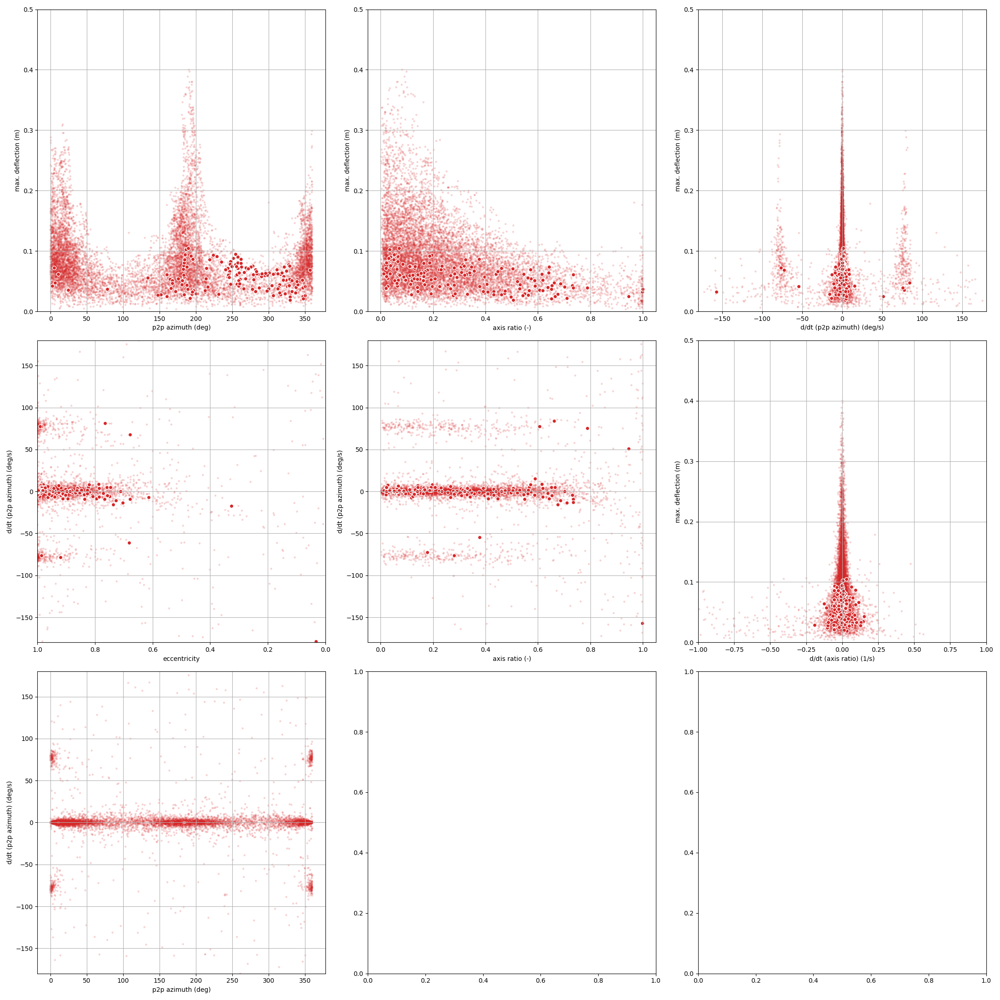

<ipython-input-36-228d043cd431>:120: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(ncols=2, nrows=2, figsize=(22,11))


<IPython.core.display.Javascript object>


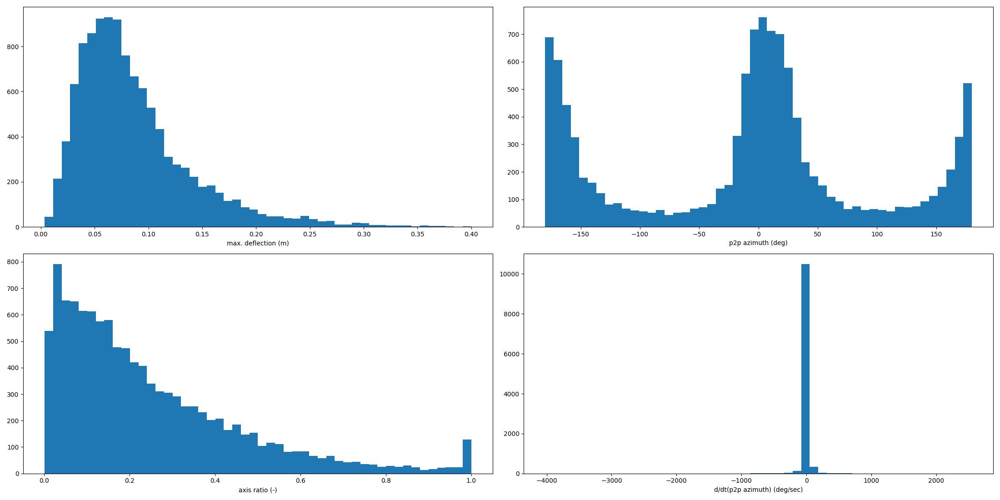

In [38]:
for (start, end) in sbi_indices:
    landing = None
    for bl in blade_landings:
        if bl > start and bl < end:
            print(f'found a matching blade landing: {bl}')
            landing = bl
    report_sbi_timeseries(turbine_8_geometry, start=start, end=end, landing=landing, smoothing_window='1s')
    report_sbi_scatter(turbine_8_geometry, start=start, end=end, landing=landing, smoothing_window='1s')
    report_sbi_distributions(turbine_8_geometry, start=start, end=end, landing=landing, smoothing_window='1s')

<IPython.core.display.Javascript object>


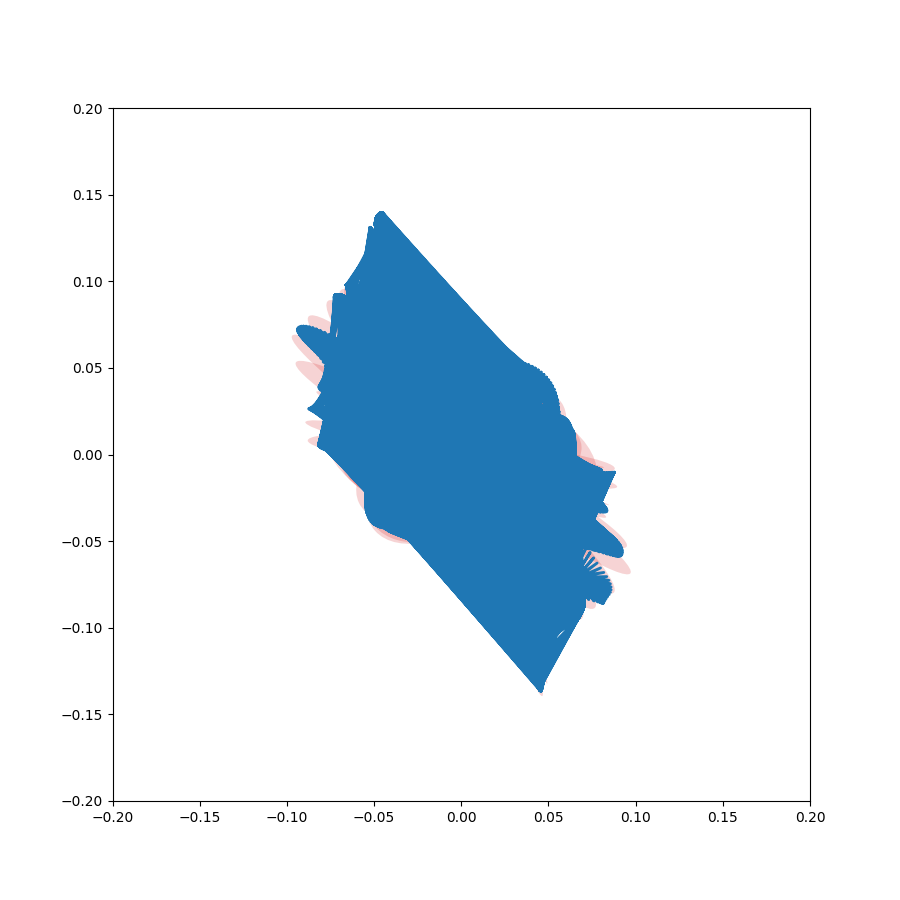

In [255]:
start = pd.to_datetime('2019-10-15 14:01:00+02:00')
end = pd.to_datetime('2019-10-15 14:02:30+02:00')

orbit_i = turbine_8.helihoist[start:end].index
geometry_i = turbine_8_geometry.helihoist[start:end].index.to_list()

nframes = 3600

p2p_x, p2p_y = [], []
orbit_x, orbit_y = [], []

fig = plt.figure(figsize=(9, 9))
plt.axis('equal')
ax = plt.axes(xlim=(-0.2, 0.2), ylim=(-0.2, 0.2))

orbit, = ax.plot([], [], lw=2, color='tab:blue')
#p2p, = ax.plot([], [], lw=2, color='white')


def init():
    # remove the first index from the geometry index list
    # geometry_i.pop(0)
    p2p.set_data([], [])
    orbit.set_data([], [])
    return (p2p, orbit)

def update(i):

    orbit_x.append(turbine_8.helihoist.pos_z[orbit_i[i]])
    orbit_y.append(turbine_8.helihoist.pos_x[orbit_i[i]])
    
    orbit.set_data(orbit_x, orbit_y)
    return (p2p, orbit)

anim = FuncAnimation(fig, update, init_func=init, frames=1000, interval=1, blit=True, repeat=False)
# anim.save(f'turbine-08_orbit.mp4') 

<IPython.core.display.Javascript object>


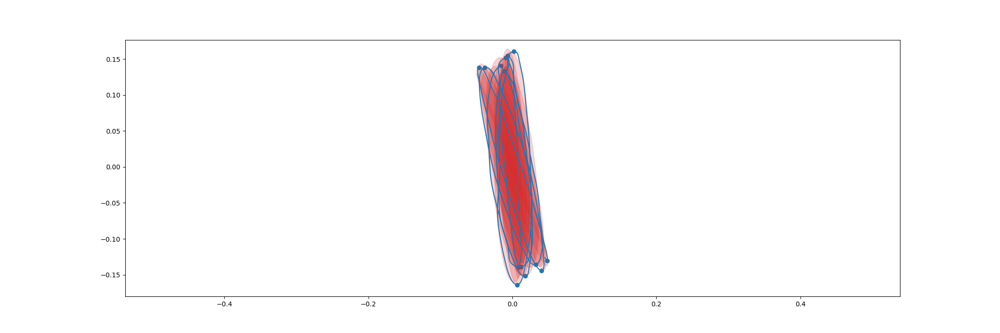

<IPython.core.display.Javascript object>


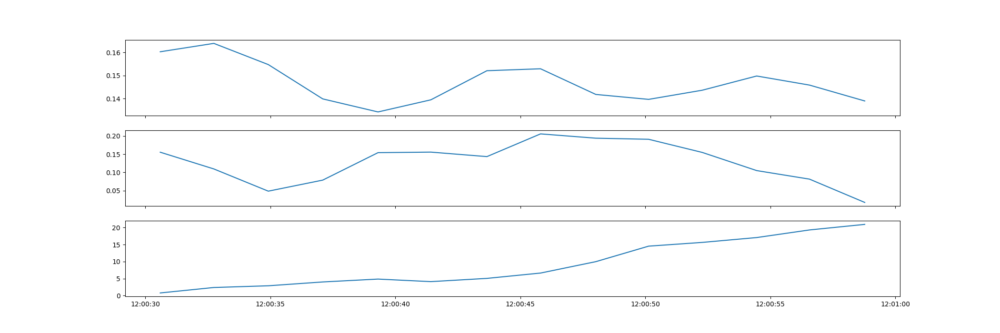

In [150]:

start = pd.to_datetime('2019-10-15 14:00:30+02:00')
end = pd.to_datetime('2019-10-15 14:00:59+02:00')



plt.figure()
plt.plot(turbine_8.helihoist[start:end].pos_z, turbine_8.helihoist[start:end].pos_x)
plt.scatter(turbine_8.helihoist[start:end].pos_z[turbine_8_geometry.helihoist[start:end].index],
            turbine_8.helihoist[start:end].pos_x[turbine_8_geometry.helihoist[start:end].index]
           )
plt.axis('equal')

ax = plt.gca()

for t in turbine_8_geometry.helihoist[start:end].index:
    ax.add_artist(Ellipse((0,0),
                          2 * turbine_8_geometry.helihoist.axis_ratio.loc[t] * turbine_8_geometry.helihoist.max_deflection.loc[t],
                          2 * turbine_8_geometry.helihoist.max_deflection.loc[t],
                          angle = turbine_8_geometry.helihoist.p2p_angle_unsigned.loc[t],
                          alpha = 0.2,
                          color = 'tab:red',
                         )
                 )

fig, (ax1, ax2, ax3) = plt.subplots(sharex=True, nrows=3)
ax1.plot(turbine_8_geometry.helihoist[start:end].max_deflection)
ax2.plot(turbine_8_geometry.helihoist[start:end].axis_ratio)
ax3.plot(turbine_8_geometry.helihoist[start:end].p2p_angle_signed)

In [53]:
ref_vec = np.array([0, 1, 0])
view = np.array([0, 0, 1])
print(vg.signed_angle(np.array([-1, 1, 0]), ref_vec, view))

-45.00000000000001


In [15]:
plt.figure()
plt.hist(turbine_8_geometry.helihoist[sbi_indices[0][0]:].max_deflection, bins='fd',)

plt.figure()
plt.psd(turbine_8_geometry.helihoist.max_deflection[sbi_indices[0][0]:].resample('2s').mean().fillna(method='ffill'), Fs=0.5)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

(array([3.21178414e+00, 1.80934086e+00, 1.69261607e-01, 9.01850519e-02,
        4.88380882e-02, 3.09774527e-02, 2.37157073e-02, 1.75825508e-02,
        1.54276124e-02, 1.28838346e-02, 9.62283448e-03, 8.44062898e-03,
        7.91865642e-03, 6.67895210e-03, 5.92559093e-03, 5.13396088e-03,
        4.80350012e-03, 4.64848333e-03, 4.11082410e-03, 3.47031948e-03,
        3.02223219e-03, 2.82865915e-03, 2.97015158e-03, 2.79415286e-03,
        2.55786449e-03, 2.45022021e-03, 2.41018341e-03, 1.99221866e-03,
        1.74309866e-03, 1.78489252e-03, 1.86953522e-03, 1.83211963e-03,
        1.71153309e-03, 1.49623253e-03, 1.32019469e-03, 1.19273234e-03,
        1.10713462e-03, 1.08728489e-03, 1.06758525e-03, 8.32141020e-04,
        8.59871874e-04, 8.87543653e-04, 7.92240024e-04, 7.43992254e-04,
        6.48691889e-04, 5.72514628e-04, 5.24928175e-04, 5.48549967e-04,
        5.50687364e-04, 5.60007595e-04, 5.09060634e-04, 4.84099705e-04,
        4.60666403e-04, 4.28066293e-04, 4.17511438e-04, 3.897311

In [16]:
plt.figure()
plt.hist(turbine_8_geometry.helihoist[sbi_indices[0][0]:].p2p_angle_signed.apply(lambda x: x + 360 if x < 0 else x), bins='fd', alpha=0.5)
plt.hist(turbine_8_geometry.lidar[sbi_indices[0][0]:].wind_dir_0_nacelle, bins='fd', alpha=0.5)
plt.hist(turbine_8_geometry.waves[sbi_indices[0][0]:].Dirp_nacelle, bins='fd', alpha=0.5)

<IPython.core.display.Javascript object>

(array([31.,  0., 33., 12.]),
 array([ 41.26872887, 111.59372887, 181.91872887, 252.24372887,
        322.56872887]),
 <a list of 4 Patch objects>)

In [17]:
plot_blade_landing(helihoist=turbine_8.helihoist, sbitroot=turbine_8.sbitroot, sbittip=turbine_8.sbittip, first_contact=blade2_start, blade_landing=blade2_landing, save_fig_path='/tmp/deflections-bladelanding.png')

<IPython.core.display.Javascript object>

In [18]:
plot_blade_landing_geometry(helihoist=turbine_8_geometry.helihoist, sbitroot=turbine_8_geometry.sbitroot, sbittip=turbine_8_geometry.sbittip, first_contact=blade2_start, blade_landing=blade2_landing, resample_window='33ms', rolling_window='2min', save_fig_path='../results/turbine-08/deflections-bladelanding-smooth.png')

<IPython.core.display.Javascript object>

In [19]:
t1 = blade_landing - pd.to_timedelta(1, unit='hour')
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, sharex=True, sharey=True, figsize=(16,9))
ax1.set_aspect('equal', 'box')
ax1.set_title('helihoist')
ax1.set_ylabel('fore-aft (m)')
ax1.set_xlabel('side-side (m)')
ax1.plot(helihoist[first_contact:blade_landing].pos_z, helihoist[first_contact:blade_landing].pos_x)
ax2.set_aspect('equal', 'box')
ax2.set_title('sbitroot')
ax2.set_xlabel('side-side (m)')
ax2.plot(sbitroot[first_contact:blade_landing].pos_z, sbitroot[first_contact:blade_landing].pos_x)
ax3.set_aspect('equal', 'box')
ax3.set_title('sbittip')
ax3.set_xlabel('side-side (m)')
ax3.plot(sbittip[first_contact:blade_landing].pos_z, sbittip[first_contact:blade_landing].pos_x)
fig.savefig('../results/turbine-12/turbine-12_bladelanding_orbits.png', dpi=300)

<IPython.core.display.Javascript object>

NameError: name 'helihoist' is not defined

## Orbit Ellipses

In [ ]:
fig, (ax1, ax2) = plt.subplots(nrows=2, sharex=True, sharey=True, figsize=(15, 10))
ax1.plot(helihoist_geometry_df.axis_ratio.rolling('1min').mean())
ax2.plot(helihoist_geometry_df.eccentricity.rolling('1min').mean())


In [ ]:

fig, (ax1, ax2, ax3) = plt.subplots(nrows=3, sharex=True, figsize=(16, 9))

ax1.plot(helihoist.pos_x, label='helihoist')
ax1.plot(sbitroot.pos_x, label='sbitroot')
ax1.plot(sbittip.pos_x, label='sbittip')
ax1.axvline(x=first_contact, color='tab:red', linestyle='--', label='first contact')
ax1.axvline(x=blade_landing, color='tab:red', label='blade landing')
ax1.set_title('X (for-aft)')
ax1.set_ylim([-0.15, 0.15])
ax1.set_ylabel('(m)')
ax1.legend(ncol=5, loc='lower right')

ax2.plot(helihoist.pos_z, label='helihoist')
ax2.plot(sbitroot.pos_z, label='sbitroot')
ax2.plot(sbittip.pos_z, label='sbittip')
ax2.axvline(x=first_contact, color='tab:red', linestyle='--', label='first contact')
ax2.axvline(x=blade_landing, color='tab:red', label='blade landing')
ax2.set_title('Z (side-side)')
ax2.set_ylim([-0.15, 0.15])
ax2.set_ylabel('(m)')
ax2.legend(ncol=5, loc='lower right')


ax3.plot(helihoist_geometry_df.p2p_angle, alpha=0.3, label='p2p angle')
ax3.plot(helihoist_geometry_df.axis_angle[::2], alpha=0.3, label='orbit main axis angle')
ax3.plot(helihoist_geometry_df.p2p_angle.rolling('2min').mean(), label='p2p angle (2min rolling mean)')
ax3.plot(helihoist_geometry_df.axis_angle[::2].rolling('2min').mean(), label='orbit main axis angle (2min rolling mean)')
ax3.axvline(x=first_contact, color='tab:red', linestyle='--', label='first contact')
ax3.axvline(x=blade_landing, color='tab:red', label='blade landing')
ax3.set_ylabel('p2p angle (due North)')
ax3.legend(ncol=3, loc='lower right')
ax3.set_xlabel('date / time')

fig.savefig('../results/turbine-12/directionality.png', dpi=300)

## Distribution of data prior to blade landing

In [ ]:
t1 = blade_landing - pd.to_timedelta(1, unit='h')
t2 = blade_landing

In [ ]:
N = len(helihoist.pos_x)

plt.figure(figsize=(5,5))
plt.hist(helihoist.pos_x[t1:t2], bins='fd', alpha=0.5, label='helihoist f-a')
plt.hist(sbitroot.pos_x[t1:t2], bins='fd', alpha=0.5, label='sbitroot f-a')
plt.hist(sbittip.pos_x[t1:t2], bins='fd', alpha=0.5, label='sbittip f-a')
plt.legend()
plt.xlabel('fore-aft deflection (m)')
plt.savefig('../results/turbine-12/fore-aft_deflection-distribution.png', dpi=300)

In [ ]:
plt.figure(figsize=(5,5))
plt.hist(helihoist.pos_z[t1:t2], bins='fd', alpha=0.5, label='helihoist s-s')
plt.hist(sbitroot.pos_z[t1:t2], bins='fd', alpha=0.5, label='sbitroot s-s')
plt.hist(sbittip.pos_z[t1:t2], bins='fd', alpha=0.5, label='sbittip s-s')
plt.legend()
plt.xlabel('side-side deflection (m)')
plt.savefig('../results/turbine-12/side-side_deflection-distribution.png', dpi=300)

In [ ]:
plt.figure()
plt.hist(helihoist.pos_x[t1:t2], bins='fd', alpha=0.5)
plt.hist(helihoist.pos_z[t1:t2], bins='fd', alpha=0.5)
plt.hist(sbitroot.pos_x[t1:t2], bins='fd', alpha=0.5)
plt.hist(sbitroot.pos_z[t1:t2], bins='fd', alpha=0.5)
plt.hist(sbittip.pos_x[t1:t2], bins='fd', alpha=0.5)
plt.hist(sbittip.pos_z[t1:t2], bins='fd', alpha=0.5)
;

In [ ]:
plt.figure()
plt.title('Histogramm deflection')
plt.hist(helihoist.deflection[t1:t2], bins='fd', alpha=0.5, label='helihoist deflection')
plt.hist(sbitroot.deflection[t1:t2], bins='fd', alpha=0.5, label='sbitroot deflection')
plt.hist(sbittip.deflection[t1:t2], bins='fd', alpha=0.5, label='sbittip deflection')
plt.xlabel('deflection (m)')
plt.legend()
plt.savefig('../results/turbine-12/deflection-distribution.png', dpi=300)

In [ ]:
plt.figure()
plt.title('p2p angle')
plt.hist(helihoist_geometry_df[t1:t2].p2p_angle.rolling('2min').mean())
plt.figure()
plt.title('Axis angle')
plt.hist(helihoist_geometry_df[t1:t2].axis_angle[::2].rolling('2min').mean())